# Disease follow-up analysis

In this notebook we explore targets with different types of evidence for lung diseases

In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

import scipy

In [2]:
import upsetplot

In [3]:
import gseapy as gp
from gseapy.plot import barplot, dotplot

names = gp.get_library_name()
gene_sets=['MSigDB_Hallmark_2020', 'GO_Biological_Process_2017', 'GO_Molecular_Function_2017', 
           'GO_Cellular_Component_2017']


In [4]:
import json

import obonet

obo_file = "/nfs/team205/ed6/bin/sc_target_evidence/data/cl.obo"  # downloaded from http://obofoundry.org/ontology/cl.html

# Load the ontology from the OBO file
graph = obonet.read_obo(obo_file)

def ontology2name(o):
    return(graph.nodes.get(o)['name'])

R plotting setup

In [5]:
## r2py setup
# import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# anndata2ri.activate()

In [6]:
%load_ext rpy2.ipython

In [7]:
%%R
library(tidyverse)
library(reshape2)
library(patchwork)

remove_x_axis <- function(){
  theme(axis.text.x = element_blank(), axis.ticks.x = element_blank(), axis.title.x = element_blank())  
}

remove_y_axis <- function(){
  theme(axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.title.y = element_blank())  
}

System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to create bus connection: Host is down


In [8]:
## Get table of all genes
import genomic_features as gf
import os
ensdb = gf.ensembl.annotation(species="Hsapiens", version="108")
genes = ensdb.genes()

data_dir = '/nfs/team205/ed6/bin/sc_target_evidence/data/'

## Small molecule / antibody tractable targets
nelson_anno_dataset = data_dir + 'genetic_support/data/gene_lists/' ## Downloaded from https://github.com/ericminikel/genetic_support
gene_annotations = [x for x in os.listdir(nelson_anno_dataset) if x.endswith(".tsv")]

annos = {}
for g in gene_annotations:
    anno_name = g.split(".tsv")[0]
    annos[anno_name] = pd.read_table(nelson_anno_dataset + g, header=None).values.flatten()

ens_ids_to_name = genes[['gene_id', 'gene_name']].copy()
annos.pop('ab_tractable')
annos.pop('sm_tractable')

array(['TARBP1', 'SMG6', 'P2RX5', ..., 'GPR25', 'C3AR1', 'PPIA'],
      dtype=object)

In [9]:
## Get list of all possible genes you might need 
json_file = data_dir + 'target_universe_dict.json'
with open(json_file, "r") as json_file:
    universe_dict = json.load(json_file)

In [10]:
reversed_annos = {value: key for key, values in annos.items() for value in values}

Make constants and palettes (for python and R plotting)

In [11]:
figdir = '/home/jovyan/mount/gdrive/sc_targetID/plots/disease_followups/'
if not os.path.exists(figdir):
    os.mkdir(figdir)

In [12]:
def _palette_df_from_dict(palette_dict):
    palette_df = pd.DataFrame(palette_dict.values(), index=palette_dict.keys())
    palette_df.columns = ['color']
    return(palette_df)
    
## Gene classes 
GENE_CLASS_ORDER = ['nuclear_receptors', 'catalytic_receptors', 'rhodop_gpcr', 'transporters', 'kinases', 'enzymes', 'ion_channels', 'other']
gene_class_palette = {
    x:sns.color_palette('Set1').as_hex()[i] if x != 'other' else sns.color_palette('Set1').as_hex()[-1] for i,x in enumerate(GENE_CLASS_ORDER)
}
gene_class_palette_df = _palette_df_from_dict(gene_class_palette)

In [13]:
%%R -i gene_class_palette_df -i figdir
gene_class_palette <- setNames(gene_class_palette_df$color, rownames(gene_class_palette_df))

# utils
ggsave_figdir <- function(output_name, width, height){
    ggsave(paste0(figdir, output_name, '.png'), width = width, height = height) 
    ggsave(paste0(figdir, output_name, '.pdf'), width = width, height = height)
}


/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


## Load metadata

In [14]:
## Load donor metadata in cxg
cxg_metadata = pd.read_csv('../data/cellxgene_hsapiens_donor_metadata.disease_relevant_annotation.csv', index_col=0)

In [15]:
disease_info_df = cxg_metadata[['disease_relevant_tissue', 'disease_ontology_id', 'disease']].drop_duplicates()
disease_name_mapper = dict(zip(disease_info_df['disease_ontology_id'], disease_info_df['disease']))
disease_tissue_mapper = dict(zip(disease_info_df['disease_ontology_id'], disease_info_df['disease_relevant_tissue']))

## Compare prioritized targets

In [16]:
data_dir = '../data/'

In [17]:
## Read OT evidence table
OT_targets_df =  pd.read_csv(data_dir + 'TargetDiseasePairs_OpenTargets_cellXgeneID_12072023.clean.csv', index_col=0)
OT_targets_df['has_genetic_support'] = (OT_targets_df['genetic_association'] > 0).astype(int)

In [18]:
targets_evidence_all = pd.read_csv(data_dir + 'disease_target_evidence.all.csv')

In [19]:
## Preprocess expression
def _process_pbulk(pbulk_adata):
    cpms = scipy.sparse.csr_matrix(pbulk_adata_coarse.X.T / pbulk_adata.obs['size_factors'].values.flatten()) * 1000000
    pbulk_adata.layers['logcounts'] = np.log1p(cpms).T
    pbulk_adata.var['mean_logcounts'] = np.array(pbulk_adata.layers['logcounts'].mean(0)).flatten()

    pbulk_adata.obs['plot_ct_id'] = pbulk_adata.obs['high_level_cell_type_ontology_term_id'].str.replace(":", '_')
    pbulk_adata.obs['plot_ct_id'] = pbulk_adata.obs['plot_ct_id'].astype('category')
    ct_levels = [f'{ontology2name(x)} ({x})' for x in pbulk_adata.obs['plot_ct_id'].cat.categories.str.replace("_", ":").tolist()]
    pbulk_adata.obs['high_level_cell_type'] = [f'{ontology2name(x)} ({x})' for x in pbulk_adata.obs['plot_ct_id'].str.replace("_", ":").tolist()]
    pbulk_adata.obs['high_level_cell_type'] = pbulk_adata.obs['high_level_cell_type'].astype('category').cat.reorder_categories(ct_levels)
    return(pbulk_adata)

In [20]:
def get_evidence_celltypes(de_res, targets_res, signif_alpha = 0.01, clinical_status_cols = ['is_effective'], evidence='disease'):
    if evidence== 'disease':
        signif_DE = de_res[(de_res.adj_pval < signif_alpha) & (de_res.lfc > 0.5) ].copy()
    elif evidence == 'celltype':
        signif_DE = de_res[(de_res.adj_pval < signif_alpha) & (de_res.lfc > 5) ].copy()
    ct2gene_evidence = sc.metrics.confusion_matrix('gene_id', 'high_level_cell_type_ontology_term_id',data=signif_DE[['gene_id', 'high_level_cell_type_ontology_term_id']], normalize=False)
    if ct2gene_evidence.columns[0].startswith("CL"):
        ct2gene_evidence.columns = [ontology2name(x.replace("_", ":")) for x in ct2gene_evidence.columns]
    ct2gene_evidence = pd.merge(ct2gene_evidence.reset_index(), targets_res[clinical_status_cols + ['gene_id']], how='left')
    ct2gene_evidence = pd.merge(ct2gene_evidence, de_res[['gene_id', 'gene_name']].drop_duplicates(), how='left').drop('gene_id', axis=1).set_index('gene_name')
    return(ct2gene_evidence)
    

def enrichment_analysis(
    targets_res_coarse, 
    filter_gene_class = 'other',
    filter_evidence = {
        'has_genetic_support':1,
        'disease_evidence':0,
        'ct_marker_evidence':0
    },
    fdr_alpha=0.1):

    filters = [(targets_res_coarse[k] == v) for k,v in filter_evidence.items()]
    keep_evidence = pd.concat(filters, axis=1).all(axis = 1)

    if isinstance(filter_gene_class, str):
        filter_gene_class = [filter_gene_class]

    target_genes = targets_res_coarse.gene_id[
        keep_evidence & (targets_res_coarse['gene_class'].isin(filter_gene_class))].unique()
    target_genes = [x for x in target_genes if x in gene_names_df.index]
    gene_list = gene_names_df.loc[target_genes].gene_name.tolist()
    gene_list = [x for x in gene_list if not x.startswith('ENS0')]
    background = DE_res_coarse.gene_name.unique()

    # list, dataframe, series inputs are supported
    enr_genetics_other = gp.enrichr(gene_list=gene_list,
         gene_sets=gene_sets,
         organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
         background=background,
         outdir='./enrichr/',
         # no_plot=True,
         cutoff=fdr_alpha # test dataset, use lower value from range(0,1)
        )
    results_df = enr_genetics_other.results[['Gene_set', "Term", 'P-value', 'Adjusted P-value', 'Genes']]
    results_df.columns = ['gene_set', 'term', 'pval', 'adj_pval', 'genes']
    return(results_df)

### IPF

In [177]:
disease_ontology_id = 'MONDO_0002771'

In [178]:
pbulk_adata_coarse = sc.read_h5ad(data_dir + f'cellxgene_targets_{disease_ontology_id.replace(":", "_")}.pbulk_all_genes.h5ad')
pbulk_adata_coarse[pbulk_adata_coarse.obs['disease'] != 'normal'].obs.donor_id.nunique()
pbulk_adata_coarse = _process_pbulk(pbulk_adata_coarse)


In [179]:
gene_names_df = pbulk_adata_coarse.var[['feature_name', 'feature_id']].copy()
gene_names_df.columns = ['gene_name', 'gene_id']

In [180]:
## Preprocess expression
def _process_pbulk(pbulk_adata):
    cpms = scipy.sparse.csr_matrix(pbulk_adata_coarse.X.T / pbulk_adata.obs['size_factors'].values.flatten()) * 1000000
    pbulk_adata.layers['logcounts'] = np.log1p(cpms).T
    pbulk_adata.var['mean_logcounts'] = np.array(pbulk_adata.layers['logcounts'].mean(0)).flatten()

    pbulk_adata.obs['plot_ct_id'] = pbulk_adata.obs['high_level_cell_type_ontology_term_id'].str.replace(":", '_')
    pbulk_adata.obs['plot_ct_id'] = pbulk_adata.obs['plot_ct_id'].astype('category')
    ct_levels = [f'{ontology2name(x)} ({x})' for x in pbulk_adata.obs['plot_ct_id'].cat.categories.str.replace("_", ":").tolist()]
    pbulk_adata.obs['high_level_cell_type'] = [f'{ontology2name(x)} ({x})' for x in pbulk_adata.obs['plot_ct_id'].str.replace("_", ":").tolist()]
    pbulk_adata.obs['high_level_cell_type'] = pbulk_adata.obs['high_level_cell_type'].astype('category').cat.reorder_categories(ct_levels)
    return(pbulk_adata)

pbulk_adata_coarse = _process_pbulk(pbulk_adata_coarse)


In [181]:
## Read results with coarse annotations
targets_res_coarse = targets_evidence_all[targets_evidence_all.disease_ontology_id == disease_ontology_id]
DE_res_coarse = pd.read_csv(f'../data/DE_diseasecelltype_{disease_ontology_id}.hvgs.csv')
DE_ct_res_coarse = pd.read_csv(f'../data/DE_celltype_{disease_ontology_id}.hvgs.csv')

In [174]:
targets_res_coarse.sum()

/tmp/ipykernel_5884/3764932892.py:1: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  targets_res_coarse.sum()


Unnamed: 0.1                                                      1517773625
Unnamed: 0                                                        1517773625
gene_id                    ENSG00000027697ENSG00000037280ENSG00000040275E...
disease_ontology_id        MONDO_0002771MONDO_0002771MONDO_0002771MONDO_0...
genetic_association                                                 4.909033
known_drug                                                          9.977486
is_druggable                                                            21.0
is_safe                                                                 16.0
is_effective                                                            13.0
is_approved                                                             10.0
has_genetic_support                                                     17.0
ct_marker_evidence                                                    1167.0
bulk_disease_evidence                                                   72.0

In [182]:
success_cols = ['is_safe','is_effective', 'is_approved']
cluster_clinical_status = True
evidence_cols = ['has_genetic_support', 'disease_evidence', 'ct_marker_evidence']

## -- Get info on explored targets -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 1][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
row_order = pl_df.sort_values(['gene_class'] + evidence_cols).gene_name.unique().tolist() # Order by gene class

# Group targets by highest success
pl_df['success_group'] = np.where(
    (pl_df.is_safe == 1) & (pl_df.is_effective == 0), 'safe',
    np.where((pl_df.is_approved == 0) & (pl_df.is_effective == 1), 'effective', 'approved'))

targets_pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class', 'success_group']).copy()
targets_pl_df['col_class'] = np.where(targets_pl_df['variable'].isin(evidence_cols), 'evidence', 'drug target\nclass')

## -- Get fraction of unexplored targets by class -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 0][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class'])
frac_pl_df = pl_df[pl_df.value == 1].groupby(['variable','gene_class']).sum().reset_index()

/tmp/ipykernel_5884/1740083542.py:7: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5884/1740083542.py:20: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5884/1740083542.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


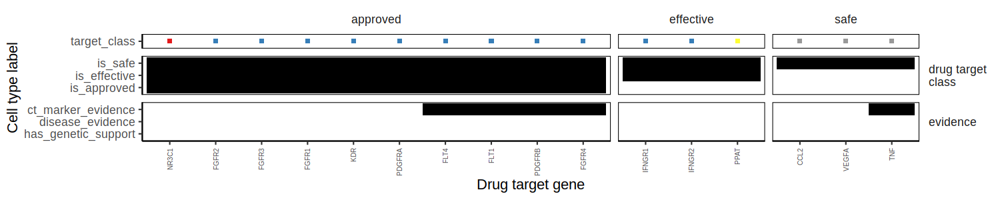

In [183]:
%%R -i targets_pl_df -i frac_pl_df -i evidence_cols -i row_order -w 1500 -h 300
# lapply(c('safe', 'effective', 'approved'), function(success_col){ 
pl1 <- targets_pl_df %>%
    mutate(value= ifelse(value==1, '1', NA)) %>%
    mutate(variable = factor(variable, levels=c(unlist(evidence_cols), 'is_approved', 'is_effective', 'is_safe'))) %>%
    arrange(variable) %>%
    mutate(gene_name=factor(gene_name, levels=row_order)) %>%
    ggplot(aes(gene_name, variable)) +
    geom_tile(aes(fill=value)) +
    geom_point(data=. %>% group_by(gene_name) %>% mutate(variable='target_class', col_class=''), aes(color=gene_class), 
               shape=15, size=3) +
    facet_grid(col_class~success_group, scales='free', space='free') +
    scale_color_manual(values=gene_class_palette, name='Gene class') +
    scale_fill_manual(values=c('black'), na.value="white") +
    theme_classic(base_size=22) +
    ylab('Cell type label') + xlab('Drug target gene') +
    guides(fill='none', color='none') +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5, size=10), 
          strip.text.y = element_text(angle=0, hjust=0),
          strip.background = element_rect(fill = "transparent", color=NA),
           strip.placement = "outside",
            panel.border = element_rect(color = "black", fill = NA)) 

pl1 
# + ggsave_figdir('IPF_explored_targets', width=27, height=5)

# pl2 <- frac_pl_df %>%
#     mutate(variable = factor(variable, levels=c('has_genetic_support', 'disease_evidence', 'ct_marker_evidence'))) %>%
#     group_by(variable) %>%
#     mutate(n = sum(value)) %>%
#     ggplot(aes(variable, value)) +
#     geom_col(aes(fill=gene_class), position='fill') +
#     geom_text(data = . %>% distinct(n, variable),
#               aes(y=1.2, label=paste('n =', n)), size=6, hjust=1) +
#     scale_fill_manual(values=gene_class_palette, name='Gene class') +
#     theme_classic(base_size=22) +
#     ylab('Fraction of unexplored genes') + xlab('') +
#     coord_flip(expand=FALSE) +
#     theme(legend.position='top')

# pl2 + ggsave_figdir('IPF_fraction_unexplored', width=12, height=3)

In [185]:
n_pbulks = pbulk_adata_coarse.obs.groupby('high_level_cell_type').count()['assay']
n_cells = pbulk_adata_coarse.obs.groupby('high_level_cell_type').sum('n_cells')['n_cells']
plot_cts = n_pbulks.index[(n_pbulks > 5) & (n_cells > 100)].to_list()
pl_adata = pbulk_adata_coarse[pbulk_adata_coarse.obs['high_level_cell_type'].isin(plot_cts)].copy()

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


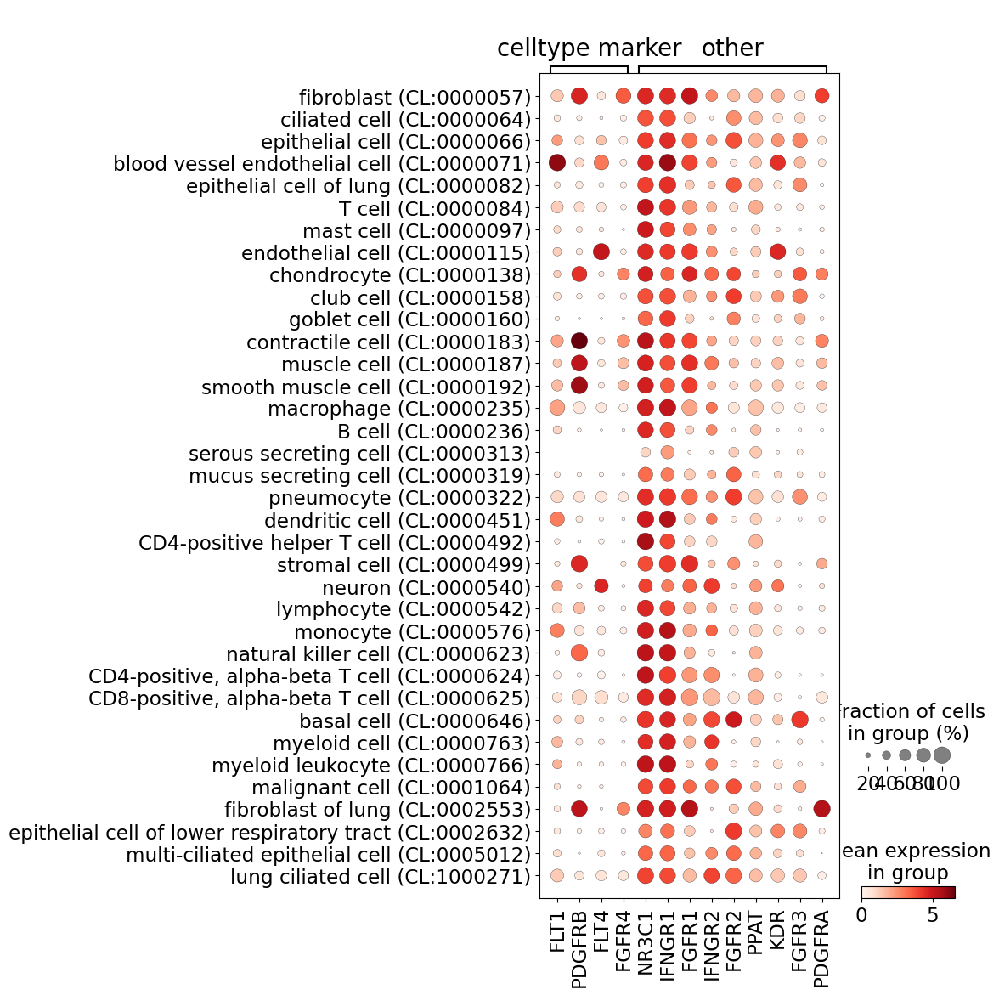

In [186]:
gs_markers = targets_res_coarse.gene_name[(targets_res_coarse.is_effective == 1) & (targets_res_coarse.ct_marker_evidence == 1)].unique()
gs_other = targets_res_coarse.gene_name[(targets_res_coarse.is_effective == 1) & (targets_res_coarse.ct_marker_evidence != 1)].unique()

# reorder by mean expression
gs_markers = pbulk_adata_coarse.var.set_index('feature_name').loc[gs_markers, 'mean_logcounts'].sort_values(ascending=False).index
gs_other = pbulk_adata_coarse.var.set_index('feature_name').loc[gs_other, 'mean_logcounts'].sort_values(ascending=False).index

with plt.rc_context({'font.size':20}):
    sc.pl.dotplot(pl_adata, 
                  {'celltype marker':gs_markers, 'other':gs_other}, 
                  groupby='high_level_cell_type', gene_symbols='feature_name', layer='logcounts', 
                  var_group_rotation=0,
#                   categories_order=order_cts
                 );

In [214]:
targets_res_coarse.sum()

/tmp/ipykernel_2081/3764932892.py:1: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  targets_res_coarse.sum()


Unnamed: 0.1                                                      1518933465
Unnamed: 0                                                          99764875
gene_id                    ENSG00000027697ENSG00000037280ENSG00000040275E...
disease_ontology_id        MONDO_0002771MONDO_0002771MONDO_0002771MONDO_0...
genetic_association                                                 4.909033
known_drug                                                          9.977486
is_druggable                                                            21.0
is_safe                                                                 16.0
is_effective                                                            13.0
is_approved                                                             10.0
has_genetic_support                                                     17.0
ct_marker_evidence                                                    1167.0
bulk_disease_evidence                                                   73.0

In [215]:
pl_df = targets_res_coarse.groupby('gene_class').sum()[['disease_evidence', 'ct_marker_evidence', 'is_effective']]
pl_df = pl_df.reset_index().melt('gene_class', var_name='evidence', value_name='n_targets')
pl_df

/tmp/ipykernel_2081/3010351775.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  pl_df = targets_res_coarse.groupby('gene_class').sum()[['disease_evidence', 'ct_marker_evidence', 'is_effective']]


,gene_class,evidence,n_targets
0,catalytic_receptors,disease_evidence,11.0
1,enzymes,disease_evidence,27.0
2,ion_channels,disease_evidence,3.0
3,kinases,disease_evidence,15.0
4,nuclear_receptors,disease_evidence,2.0
5,other,disease_evidence,334.0
6,rhodop_gpcr,disease_evidence,11.0
7,transporters,disease_evidence,8.0
8,catalytic_receptors,ct_marker_evidence,52.0
9,enzymes,ct_marker_evidence,58.0


In [216]:
gene_classes

array(['catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
       'nuclear_receptors', 'other', 'rhodop_gpcr', 'transporters'],
      dtype=object)

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


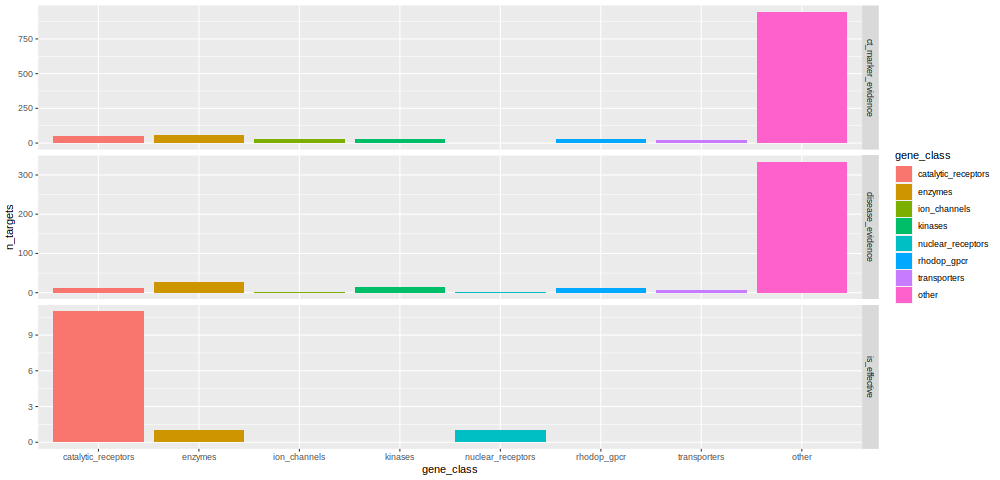

In [217]:
%%R -i pl_df -w 1000
pl_df %>%
filter(n_targets != 0 ) %>%
mutate(gene_class= factor(gene_class, levels=c('catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
       'nuclear_receptors', 'rhodop_gpcr', 'transporters', 'other'))) %>%
ggplot(aes(gene_class, n_targets, fill=gene_class)) +
geom_col() +
facet_grid(evidence~., scales='free')

In [79]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.disease_evidence == 1) & (targets_res_coarse.gene_class == 'other')].unique()].gene_name.tolist()
background = DE_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [80]:
enr.results[enr.results['Adjusted P-value'] < 0.01]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Allograft Rejection,1.682849e-06,0.000076,0,0,4.389723,58.361465,CD96;NPM1;TGFB2;FYB1;GLMN;PRF1;THY1;NME1;NCR1;...
45,GO_Biological_Process_2017,regulation of immune response (GO:0050776),4.602109e-09,0.000004,0,0,6.039729,115.943179,CD96;IGKV1-5;SH2D1B;IGLV2-8;IGLV2-11;COL1A1;NC...
46,GO_Biological_Process_2017,complement activation (GO:0006956),2.388283e-07,0.000109,0,0,7.848447,119.669362,IGLV2-8;IGLV2-11;IGHG2;IGLV1-40;CFH;IGKV1-39;I...
47,GO_Biological_Process_2017,"complement activation, classical pathway (GO:0...",5.541438e-07,0.000169,0,0,7.182049,103.463458,IGLV2-8;IGLV2-11;IGHG2;IGLV1-40;IGLV2-14;IGKV1...
48,GO_Biological_Process_2017,regulation of complement activation (GO:0030449),1.350847e-06,0.000278,0,0,6.534161,88.307746,IGLV2-8;IGLV2-11;IGHG2;IGLV1-40;CFH;IGLV2-14;I...
49,GO_Biological_Process_2017,positive regulation of interferon-gamma secret...,1.522857e-06,0.000278,0,0,166.703030,2232.974175,CD2;PTPN22;RASGRP1;CD244
50,GO_Biological_Process_2017,leukocyte migration (GO:0050900),4.190545e-06,0.000638,0,0,4.302045,53.270846,SHC1;IGKV1-5;IGLV2-8;COL1A1;IGLV2-11;CD2;DOK2;...
51,GO_Biological_Process_2017,receptor-mediated endocytosis (GO:0006898),6.969839e-06,0.000820,0,0,5.023280,59.646011,IGKV1-5;SORL1;IGF2R;IGLV2-8;IGLV2-11;IGLV1-40;...
52,GO_Biological_Process_2017,Fc-epsilon receptor signaling pathway (GO:0038...,7.174708e-06,0.000820,0,0,4.352569,51.555951,SHC1;IGKV1-5;NFATC3;NFATC2;IGLV2-8;IGLV2-11;IG...
53,GO_Biological_Process_2017,Fc-gamma receptor signaling pathway involved i...,2.325445e-05,0.002362,0,0,4.798312,51.193262,IGLV2-8;IGLV2-11;IGHG2;IGLV1-40;IGLV2-14;IGKV1...


In [81]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.ct_marker_evidence == 1) & (targets_res_coarse.gene_class == 'other')].unique()].gene_name.tolist()
background = DE_ct_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [84]:
enr.results[enr.results['Adjusted P-value'] < 0.01]['Genes'][0]

'ECM2;COL16A1;ELN;COL12A1;TNC;TNFAIP3;CXCL1;CDH6;SGCD;TIMP3;CCN1;EDIL3;POSTN;TPM2;BGN;GEM;DCN;ACTA2;SFRP4;VCAN;COL4A2;COL4A1;CDH11;COL6A3;MYL9;FOXC2;TAGLN;LAMA2;PCOLCE2;FBLN1;FSTL1;FBLN2;FBLN5;CALD1;ABI3BP;SPOCK1;SLIT3;SLIT2;CAP2;CTHRC1;IL32;PRRX1;LUM;MFAP5;COL3A1;COL1A2;CXCL12;COL5A1;COL5A3;COL5A2;MGP;PMP22;PTX3;FBN1'

/tmp/ipykernel_2081/2103994140.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']


{'matrix': <AxesSubplot: >,
 'shading': <AxesSubplot: >,
 'totals': <AxesSubplot: >,
 'intersections': <AxesSubplot: xlabel='Intersection size'>}

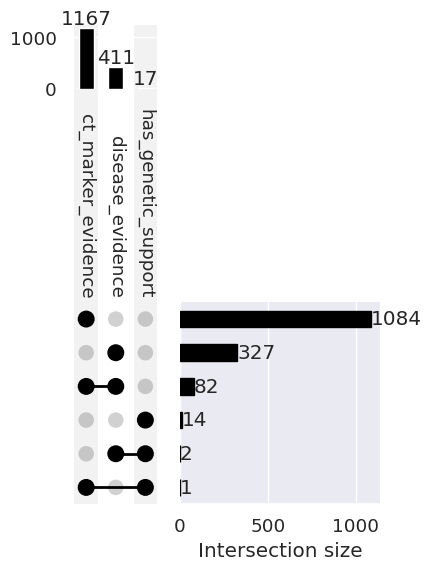

In [218]:
targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']
evidence_cols = ['ct_marker_evidence', 'disease_evidence', 'has_genetic_support']
evidence_sets_dict = {}
for ev in evidence_cols:
    evidence_sets_dict[ev] = targets_res_coarse.target_disease[
        (targets_res_coarse[ev] == 1)
    ].tolist()

evidence_upset = upsetplot.from_contents(evidence_sets_dict)

pl = upsetplot.UpSet(
    evidence_upset, 
    orientation='vertical', 
    show_counts = '{:d}', 
    sort_categories_by='cardinality',
    sort_by='cardinality', 
)
pl.plot()

### COPD

In [219]:
disease_ontology_id = 'MONDO_0005002'

In [220]:
pbulk_adata_coarse = sc.read_h5ad(data_dir + f'cellxgene_targets_{disease_ontology_id.replace(":", "_")}.pbulk_all_genes.h5ad')
pbulk_adata_coarse = _process_pbulk(pbulk_adata_coarse)
pbulk_adata_coarse[pbulk_adata_coarse.obs['disease'] != 'normal'].obs.donor_id.nunique()


18

In [221]:
gene_names_df = pbulk_adata_coarse.var[['feature_name', 'feature_id']].copy()
gene_names_df.columns = ['gene_name', 'gene_id']

In [222]:
## Read results with coarse annotations
targets_res_coarse = targets_evidence_all[targets_evidence_all.disease_ontology_id == disease_ontology_id]
DE_res_coarse = pd.read_csv(f'../data/DE_diseasecelltype_{disease_ontology_id}.hvgs.csv')
DE_ct_res_coarse = pd.read_csv(f'../data/DE_celltype_{disease_ontology_id}.hvgs.csv')

In [223]:
targets_res_coarse.sum()

/tmp/ipykernel_2081/3764932892.py:1: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  targets_res_coarse.sum()


Unnamed: 0.1                                                      5233922628
Unnamed: 0                                                         100514931
gene_id                    ENSG00000001626ENSG00000004779ENSG00000004846E...
disease_ontology_id        MONDO_0005002MONDO_0005002MONDO_0005002MONDO_0...
genetic_association                                               120.778658
known_drug                                                         85.474408
is_druggable                                                           175.0
is_safe                                                                157.0
is_effective                                                           118.0
is_approved                                                             27.0
has_genetic_support                                                    517.0
ct_marker_evidence                                                    1165.0
bulk_disease_evidence                                                 1730.0

In [224]:
pl_df = targets_res_coarse.groupby('gene_class').sum()[['disease_evidence', 'ct_marker_evidence', 'is_effective', 'has_genetic_support']]
pl_df = pl_df.reset_index().melt('gene_class', var_name='evidence', value_name='n_targets')
pl_df

/tmp/ipykernel_2081/122528365.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  pl_df = targets_res_coarse.groupby('gene_class').sum()[['disease_evidence', 'ct_marker_evidence', 'is_effective', 'has_genetic_support']]


,gene_class,evidence,n_targets
0,catalytic_receptors,disease_evidence,85.0
1,enzymes,disease_evidence,284.0
2,ion_channels,disease_evidence,59.0
3,kinases,disease_evidence,102.0
4,nuclear_receptors,disease_evidence,16.0
5,other,disease_evidence,4383.0
6,rhodop_gpcr,disease_evidence,65.0
7,transporters,disease_evidence,138.0
8,catalytic_receptors,ct_marker_evidence,52.0
9,enzymes,ct_marker_evidence,58.0


/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


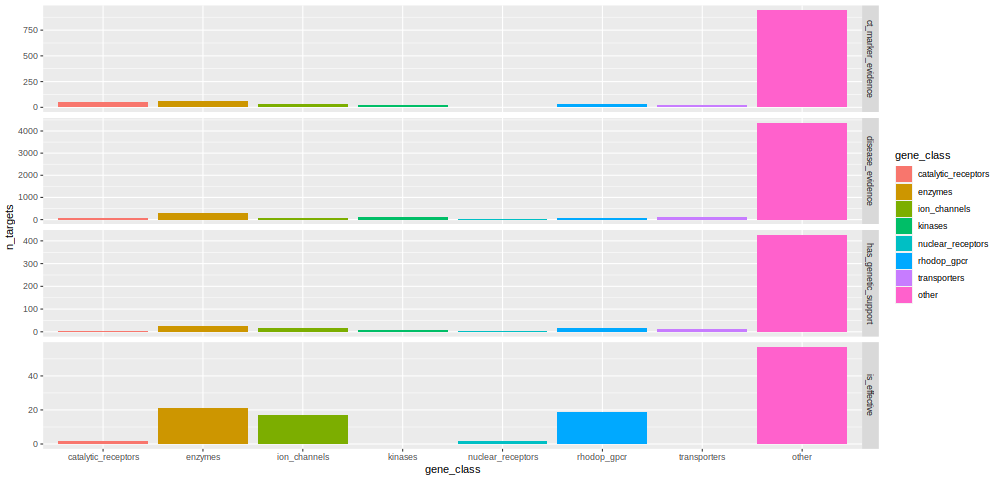

In [225]:
%%R -i pl_df -w 1000
pl_df %>%
filter(n_targets != 0 ) %>%
mutate(gene_class= factor(gene_class, levels=c('catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
       'nuclear_receptors', 'rhodop_gpcr', 'transporters', 'other'))) %>%
ggplot(aes(gene_class, n_targets, fill=gene_class)) +
geom_col() +
facet_grid(evidence~., scales='free')

In [226]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.disease_evidence == 1) & (targets_res_coarse.gene_class == 'other')].unique()].gene_name.tolist()
background = DE_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [227]:
enr.results[enr.results['Adjusted P-value'] < 0.1]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
50,GO_Biological_Process_2017,mitochondrial translational elongation (GO:007...,0.000005,0.011162,0,0,2.757607,33.553688,MRPS17;MRPS16;MRPS35;MRPS11;MRPL18;MRPS34;MRPS...
51,GO_Biological_Process_2017,mitochondrial translational termination (GO:00...,0.000008,0.011162,0,0,2.682797,31.472374,MRPS17;MRPS16;MRPS35;MRPS11;MRPL18;MRPS34;MRPS...
52,GO_Biological_Process_2017,mitochondrial respiratory chain complex I asse...,0.000064,0.058767,0,0,2.967881,28.643506,MT-ND6;MT-ND4;NDUFB8;MT-ND5;NDUFB7;NDUFA11;NDU...
53,GO_Biological_Process_2017,proteasome-mediated ubiquitin-dependent protei...,0.000085,0.058767,0,0,1.904538,17.858856,UBXN2B;FAF1;KIF14;ARRB1;PSMD8;RNF115;PSMD7;PSM...
54,GO_Biological_Process_2017,"mitochondrial electron transport, NADH to ubiq...",0.000147,0.081761,0,0,3.235767,28.551247,MT-ND6;MT-ND4L;NDUFB8;MT-ND4;MT-ND5;NDUFB7;NDU...
55,GO_Biological_Process_2017,hydrogen peroxide catabolic process (GO:0042744),0.000208,0.096204,0,0,19.763374,167.566710,PRDX3;PRDX2;GPX1;GPX3;PRDX1;PXDN;HBB;PXDNL;HBA1


Makes sense with https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9138026/

In [228]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.has_genetic_support == 1) & (targets_res_coarse.gene_class == 'other')].unique()].gene_name.tolist()
background = DE_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [229]:
enr.results[enr.results['Adjusted P-value'] < 0.1]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Apoptosis,0.000982,0.043202,0,0,3.297584,22.839248,TGFB2;CDKN1A;DFFA;LUM;CAV1;IRF1;DPYD;TIMP3;CLU...
44,GO_Biological_Process_2017,chaperone-mediated protein complex assembly (G...,0.000039,0.024738,0,0,32.485714,329.608528,HSP90AA1;HSPA4;CLU;HSPA1A
45,GO_Biological_Process_2017,interferon-gamma secretion (GO:0072643),0.000056,0.024738,0,0,121.495549,1189.667695,BTN3A1;BTN3A2;TRIM27
46,GO_Biological_Process_2017,caveola assembly (GO:0070836),0.000137,0.040486,0,0,60.743323,540.237713,CAV2;CAV1;EMP2
47,GO_Biological_Process_2017,"positive regulation of transcription, DNA-temp...",0.000333,0.073568,0,0,2.479562,19.858403,ARNT2;CASZ1;EHF;ZFHX3;NPM1;NCF1;GATA6;HMGA2;TB...
48,GO_Biological_Process_2017,positive regulation of transcription from RNA ...,0.000479,0.084819,0,0,2.147874,16.417040,CSF3;EHF;PID1;GLIS3;GATA2;ARNTL;SPIB;NRIP1;PIT...


In [192]:
annos['nuclear_receptors']

array(['AR', 'ESR1', 'ESR2', 'ESRRA', 'ESRRB', 'ESRRG', 'HNF4A', 'HNF4G',
       'NR0B1', 'NR0B2', 'NR1D1', 'NR1D2', 'NR1H2', 'NR1H3', 'NR1H4',
       'NR1I2', 'NR1I3', 'NR2C1', 'NR2C2', 'NR2E1', 'NR2E3', 'NR2F1',
       'NR2F2', 'NR2F6', 'NR3C1', 'NR3C2', 'NR4A1', 'NR4A2', 'NR4A3',
       'NR5A1', 'NR5A2', 'NR6A1', 'PGR', 'PPARA', 'PPARD', 'PPARG',
       'RARA', 'RARB', 'RARG', 'RORB', 'RORC', 'RXRA', 'RXRB', 'RXRG',
       'THRA', 'THRB', 'VDR'], dtype=object)

In [230]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.ct_marker_evidence == 1) & (targets_res_coarse.gene_class == 'other')].unique()].gene_name.tolist()
background = DE_ct_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [231]:
enr.results[enr.results['Adjusted P-value'] < 0.1]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Epithelial Mesenchymal Transition,7.882362e-08,0.000004,0,0,2.681081,43.851905,ECM2;COL16A1;ELN;COL12A1;TNC;TNFAIP3;CXCL1;CDH...
45,GO_Biological_Process_2017,positive regulation of B cell activation (GO:0...,1.103319e-05,0.007957,0,0,19.562701,223.300460,IGHG3;IGHM;IGHG4;IGLL5;IGHG1;IGHG2;IGHD;IGHA1;...
46,GO_Biological_Process_2017,extracellular matrix organization (GO:0030198),1.191853e-05,0.007957,0,0,2.647682,30.017874,COL16A1;COL13A1;LAMA2;COL14A1;LAMC3;ELN;TNC;IC...
47,GO_Biological_Process_2017,cilium movement (GO:0003341),1.734831e-05,0.007957,0,0,9.577444,104.988083,CFAP61;DNAI2;CFAP100;CFAP73;DNAH7;DNAH5;DNAAF1...
48,GO_Biological_Process_2017,"phagocytosis, recognition (GO:0006910)",3.673632e-05,0.012586,0,0,13.038585,133.146701,IGHG3;IGHM;IGHG4;IGLL5;IGHG1;IGHG2;IGHD;IGHA1;...
49,GO_Biological_Process_2017,branching involved in blood vessel morphogenes...,4.847721e-05,0.012586,0,0,17.370450,172.565287,DLL4;NRP1;SFRP2;COL4A1;NOTCH4;LEF1;SEMA3E;ENG
50,GO_Biological_Process_2017,inner dynein arm assembly (GO:0036159),5.533991e-05,0.012586,0,0,30.373262,297.719206,CFAP100;CFAP73;DNAH7;DNAAF1;DNAAF4;ZMYND10;CCDC40
51,GO_Biological_Process_2017,collagen catabolic process (GO:0030574),6.402720e-05,0.012586,0,0,4.365011,42.149429,COL15A1;COL13A1;COL12A1;COL3A1;COL1A2;COL4A2;C...
52,GO_Biological_Process_2017,monocyte chemotaxis (GO:0002548),1.867255e-04,0.032117,0,0,5.223226,44.845944,CCL14;CCL22;CCL21;CCL20;CCL5;CCL4;CCL3;XCL2;S1...
53,GO_Biological_Process_2017,cilium-dependent cell motility (GO:0060285),2.593500e-04,0.039652,0,0,26.006410,214.743566,DNAH3;DNAH2;DNAH17;DNAH7;RFX3;DRC1


In [232]:
targets_res_coarse['mean_expression'] = pbulk_adata_coarse[:, targets_res_coarse.gene_id.values].layers['logcounts'].A.mean(0)
targets_res_coarse['mean_expression_normal'] = pbulk_adata_coarse[pbulk_adata_coarse.obs.disease == 'normal',:][:, targets_res_coarse.gene_id.values].layers['logcounts'].A.mean(0)

targets_res_coarse['mean_expression_disease'] = pbulk_adata_coarse[pbulk_adata_coarse.obs.disease != 'normal',:][:, targets_res_coarse.gene_id.values].layers['logcounts'].A.mean(0)

/tmp/ipykernel_2081/2826050693.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  targets_res_coarse['mean_expression'] = pbulk_adata_coarse[:, targets_res_coarse.gene_id.values].layers['logcounts'].A.mean(0)
/tmp/ipykernel_2081/2826050693.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  targets_res_coarse['mean_expression_normal'] = pbulk_adata_coarse[pbulk_adata_coarse.obs.disease == 'normal',:][:, targets_res_coarse.gene_id.values].layers['logcounts'].A.mean(0)
/tmp/ipykernel_2081/2826050693.py:4: Se

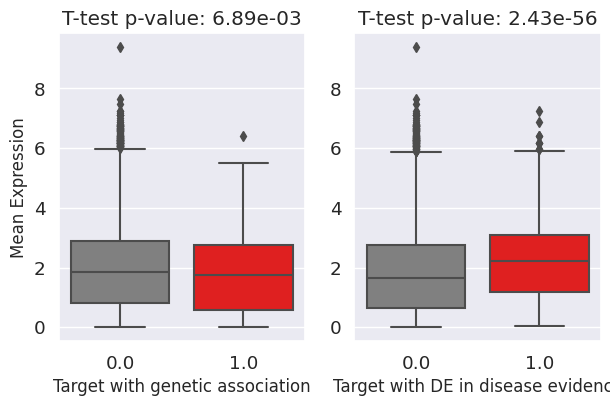

In [233]:
y_axis = 'mean_expression_normal'
pval_disease = scipy.stats.ttest_ind(targets_res_coarse[targets_res_coarse['disease_evidence'] == 1][y_axis],
    targets_res_coarse[targets_res_coarse['disease_evidence'] == 0]['mean_expression']).pvalue
pval_gen = scipy.stats.ttest_ind(targets_res_coarse[targets_res_coarse['has_genetic_support'] == 1][y_axis],
    targets_res_coarse[targets_res_coarse['has_genetic_support'] == 0]['mean_expression']).pvalue

# plt.subplot(1,2,1)
# sns.boxplot(data=targets_res_coarse,
#                x='has_genetic_support', y='mean_expression'
#               )
# plt.subplot(1,2,2)
# sns.boxplot(data=targets_res_coarse,
#                x='disease_evidence', y='mean_expression'
#               )
# Create a figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(7, 4))

# Customize the font sizes
sns.set(font_scale=1.2)  # You can adjust the scale as needed

# Boxplot 1
sns.boxplot(data=targets_res_coarse,
            x='has_genetic_support', y=y_axis,
            ax=axes[0],
            palette={0: 'grey', 1: 'red'}  # Define colors for 0 and 1
           )
axes[0].set_ylabel('Mean Expression', fontsize=12)  # Add or adjust y-axis label
axes[0].set_xlabel('Target with genetic association', fontsize=12)
axes[0].set_title('T-test p-value: {:.2e}'.format(pval_gen))

# Boxplot 2
sns.boxplot(data=targets_res_coarse,
            x='disease_evidence', y=y_axis,
            ax=axes[1],
            palette={0: 'grey', 1: 'red'}  # Define colors for 0 and 1
           )
axes[1].set_ylabel('')  # Remove y-axis label
axes[1].set_xlabel('Target with DE in disease evidence', fontsize=12)
axes[1].set_title('T-test p-value: {:.2e}'.format(pval_disease))

# Show the plot
plt.show()

/tmp/ipykernel_2081/2103994140.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']


{'matrix': <AxesSubplot: >,
 'shading': <AxesSubplot: >,
 'totals': <AxesSubplot: >,
 'intersections': <AxesSubplot: xlabel='Intersection size'>}

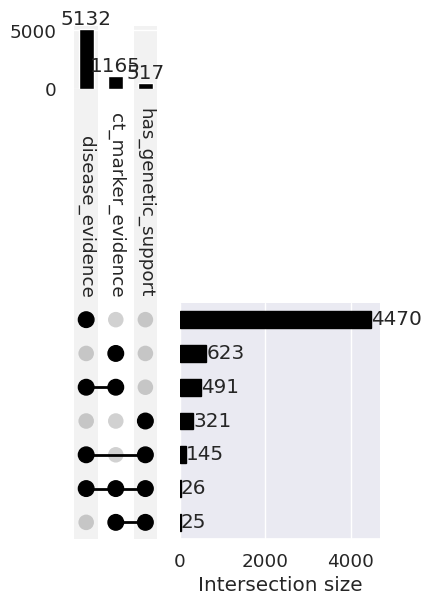

In [234]:
targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']
evidence_cols = ['ct_marker_evidence', 'disease_evidence', 'has_genetic_support']
evidence_sets_dict = {}
for ev in evidence_cols:
    evidence_sets_dict[ev] = targets_res_coarse.target_disease[
        (targets_res_coarse[ev] == 1)
    ].tolist()

evidence_upset = upsetplot.from_contents(evidence_sets_dict)

pl = upsetplot.UpSet(
    evidence_upset, 
    orientation='vertical', 
    show_counts = '{:d}', 
    sort_categories_by='cardinality',
    sort_by='cardinality', 
)
pl.plot()

### COVID

In [102]:
disease_ontology_id = 'MONDO_0100096'

In [103]:
pbulk_adata_coarse = sc.read_h5ad(data_dir + f'cellxgene_targets_{disease_ontology_id.replace(":", "_")}.pbulk_all_genes.h5ad', backed=True)
# pbulk_adata_coarse = _process_pbulk(pbulk_adata_coarse)
pbulk_adata_coarse[pbulk_adata_coarse.obs['disease'] != 'normal'].obs.donor_id.nunique()


504

In [104]:
gene_names_df = pbulk_adata_coarse.var[['feature_name', 'feature_id']].copy()
gene_names_df.columns = ['gene_name', 'gene_id']

In [105]:
## Read results with coarse annotations
targets_res_coarse = targets_evidence_all[targets_evidence_all.disease_ontology_id == disease_ontology_id]
DE_res_coarse = pd.read_csv(f'../data/DE_diseasecelltype_{disease_ontology_id}.hvgs.csv')
DE_ct_res_coarse = pd.read_csv(f'../data/DE_celltype_{disease_ontology_id}.hvgs.csv')

In [106]:
targets_res_coarse.sum()

/tmp/ipykernel_3108/3764932892.py:1: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  targets_res_coarse.sum()


Unnamed: 0.1                                                      2354557656
Unnamed: 0                                                         122672616
gene_id                    ENSG00000000938ENSG00000003400ENSG00000004779E...
disease_ontology_id        MONDO_0100096MONDO_0100096MONDO_0100096MONDO_0...
genetic_association                                                14.455754
known_drug                                                        156.501272
is_druggable                                                           378.0
is_safe                                                                354.0
is_effective                                                           235.0
is_approved                                                             62.0
has_genetic_support                                                     69.0
ct_marker_evidence                                                    1121.0
bulk_disease_evidence                                                 3631.0

In [107]:
pl_df = targets_res_coarse.groupby('gene_class').sum()[['disease_evidence', 'ct_marker_evidence', 'is_approved', 'is_effective', 'has_genetic_support']]
pl_df = pl_df.reset_index().melt('gene_class', var_name='evidence', value_name='n_targets')

/tmp/ipykernel_3108/1717192368.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  pl_df = targets_res_coarse.groupby('gene_class').sum()[['disease_evidence', 'ct_marker_evidence', 'is_approved', 'is_effective', 'has_genetic_support']]


/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


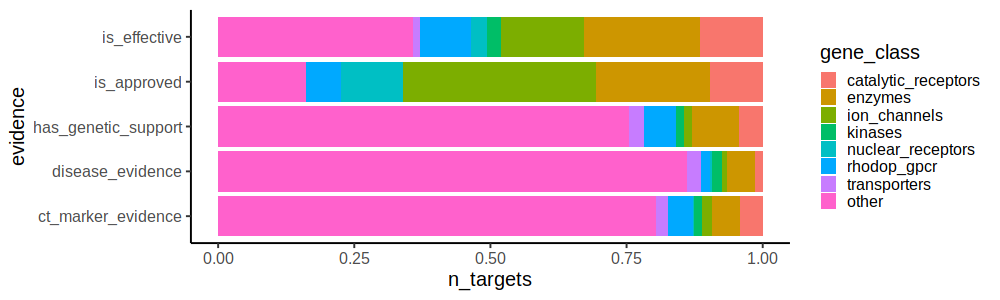

In [108]:
%%R -i pl_df -w 1000 -h 300
# pl_df %>%
# filter(n_targets != 0 ) %>%
# mutate(gene_class= factor(gene_class, levels=c('catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
#        'nuclear_receptors', 'rhodop_gpcr', 'transporters', 'other'))) %>%
# ggplot(aes(gene_class, n_targets, fill=gene_class)) +
# geom_col() +
# facet_grid(evidence~., scales='free')

pl_df %>%
filter(n_targets != 0 ) %>%
mutate(gene_class= factor(gene_class, levels=c('catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
       'nuclear_receptors', 'rhodop_gpcr', 'transporters', 'other'))) %>%
ggplot(aes(evidence, n_targets, fill=gene_class)) +
geom_col(position='fill') +
coord_flip() +
theme_classic(base_size=20)

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


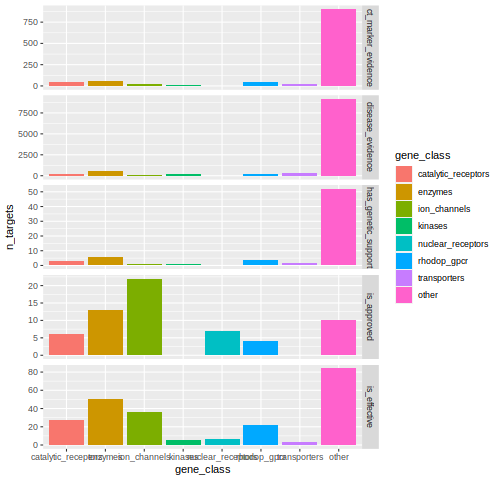

In [94]:
%%R -i pl_df -w 500
pl_df %>%
filter(n_targets != 0 ) %>%
mutate(gene_class= factor(gene_class, levels=c('catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
       'nuclear_receptors', 'rhodop_gpcr', 'transporters', 'other'))) %>%
ggplot(aes(gene_class, n_targets, fill=gene_class)) +
geom_col() +
facet_grid(evidence~., scales='free')

In [254]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.disease_evidence == 1) & (targets_res_coarse.gene_class == 'other')].unique()].gene_name.tolist()
background = DE_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [255]:
enr.results[enr.results['Adjusted P-value'] < 0.01]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Myc Targets V1,2.365667e-19,1.182833e-17,0,0,5.122688,219.702147,EIF4A1;HDDC2;RPL34;HNRNPU;HNRNPR;PWP1;PHB2;RPL...
1,MSigDB_Hallmark_2020,E2F Targets,1.133818e-12,2.834545e-11,0,0,3.282138,90.276609,DCLRE1B;JPT1;NUP107;MRE11;TFRC;DSCC1;CSE1L;CCP...
2,MSigDB_Hallmark_2020,G2-M Checkpoint,4.809498e-11,8.015831e-10,0,0,2.946572,70.004203,JPT1;CCNT1;CCNF;HNRNPU;ARID4A;MKI67;SMC4;SMC2;...
3,MSigDB_Hallmark_2020,Unfolded Protein Response,2.014881e-07,2.518601e-06,0,0,3.168929,48.857082,EIF4A2;ERO1A;H2AX;EIF4A1;FKBP14;POP4;EIF4A3;IF...
4,MSigDB_Hallmark_2020,Interferon Alpha Response,2.153876e-06,2.153876e-05,0,0,3.053645,39.844696,IFITM3;LGALS3BP;RTP4;OGFR;IFITM1;SAMD9L;IFITM2...
5,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,2.166863e-05,1.805719e-04,0,0,1.916574,20.583326,CD83;CSF2;CSF1;CD80;SERPINE1;TNC;RNF19B;IRS2;T...
6,MSigDB_Hallmark_2020,Mitotic Spindle,4.183651e-05,2.988322e-04,0,0,1.866758,18.820171,SMC3;SMC4;UXT;PREX1;OPHN1;PPP4R2;KIF5B;ARHGDIA...
7,MSigDB_Hallmark_2020,Interferon Gamma Response,2.071358e-04,1.294598e-03,0,0,1.734651,14.713549,IFITM3;CD86;SAMD9L;IFITM2;UBE2L6;IFI35;IFIT1;I...
8,MSigDB_Hallmark_2020,mTORC1 Signaling,7.773225e-04,4.318458e-03,0,0,1.643543,11.767201,ERO1A;TES;TFRC;PITPNB;CCNF;ARPC5L;PLOD2;TMEM97...
50,GO_Biological_Process_2017,translational initiation (GO:0006413),9.917601e-22,2.994124e-18,0,0,25.659772,1240.972297,RPL4;EIF4A2;RPL5;EIF4A1;RPL30;RPL3;RPL32;RPL31...


In [256]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.has_genetic_support == 1) & (targets_res_coarse.gene_class == 'other')].unique()].gene_name.tolist()
background = DE_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [257]:
enr.results[enr.results['Adjusted P-value'] < 0.01]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
19,GO_Biological_Process_2017,keratinocyte differentiation (GO:0030216),2.452164e-07,0.000035,0,0,98.079491,1492.880170,LCE2B;LCE2A;LCE4A;LCE2D
20,GO_Biological_Process_2017,interferon-gamma-mediated signaling pathway (G...,2.252311e-05,0.001588,0,0,28.183234,301.587901,OAS1;OAS2;OAS3;ICAM1
21,GO_Biological_Process_2017,glycolipid biosynthetic process (GO:0009247),4.092078e-05,0.001923,0,0,395.846154,3999.579138,ABO;GBGT1


In [258]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.ct_marker_evidence == 1) & (targets_res_coarse.gene_class == 'other')].unique()].gene_name.tolist()
background = DE_ct_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [259]:
enr.results[enr.results['Adjusted P-value'] < 0.01]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
45,GO_Biological_Process_2017,regulation of immune response (GO:0050776),2.430024e-18,2.979209e-15,0,0,4.988250,202.316582,SIGLEC9;IGHV3-23;CD3G;IGHV4-39;CD3E;TREM1;CD3D...
46,GO_Biological_Process_2017,receptor-mediated endocytosis (GO:0006898),5.345048e-11,3.276514e-08,0,0,4.172622,98.691971,SPARC;LRP1;IGHV3-23;HP;IGHV4-59;HBB;IGHV4-39;I...
47,GO_Biological_Process_2017,"complement activation, classical pathway (GO:0...",2.031219e-10,8.300916e-08,0,0,4.294935,95.850995,C1QB;C1QA;IGHV3-21;IGHV1-3;IGHV3-23;IGHV4-59;I...
48,GO_Biological_Process_2017,complement activation (GO:0006956),9.457318e-10,2.898668e-07,0,0,4.989000,103.666732,FCN1;C1QB;C1QA;IGHV3-23;IGHV4-59;IGHV4-39;IGLV...
49,GO_Biological_Process_2017,regulation of complement activation (GO:0030449),8.965661e-09,2.198380e-06,0,0,4.101184,75.994374,C1QB;C1QA;PROS1;IGHV3-23;IGHV4-59;IGHV4-39;IGL...
50,GO_Biological_Process_2017,monocyte chemotaxis (GO:0002548),4.139929e-06,8.459255e-04,0,0,12.653090,156.832922,LGALS3;IL6;CCL3L1;CCL5;CCL4;PDGFB;CCL3;XCL2;S1...
51,GO_Biological_Process_2017,platelet degranulation (GO:0002576),8.597310e-06,1.505757e-03,0,0,3.174475,37.027276,SPARC;SERPINA1;PROS1;SERPINE1;PDGFB;ENDOD1;F13...
52,GO_Biological_Process_2017,Fc-gamma receptor signaling pathway involved i...,1.807864e-05,2.770552e-03,0,0,2.695974,29.442135,IGHV3-23;IGHV4-59;CD3G;IGHV4-39;IGLV3-1;IGLV2-...
53,GO_Biological_Process_2017,positive regulation of interleukin-2 biosynthe...,3.377265e-05,4.600586e-03,0,0,inf,inf,CD86;CD4;IRF4;IL1B;CD80;CD28
54,GO_Biological_Process_2017,positive regulation of B cell activation (GO:0...,5.278848e-05,6.471868e-03,0,0,4.129555,40.672882,IGHV5-51;IGHV3-74;IGHV3-21;IGHV1-3;IGHV3-23;IG...


/tmp/ipykernel_2081/2103994140.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']


{'matrix': <AxesSubplot: >,
 'shading': <AxesSubplot: >,
 'totals': <AxesSubplot: >,
 'intersections': <AxesSubplot: xlabel='Intersection size'>}

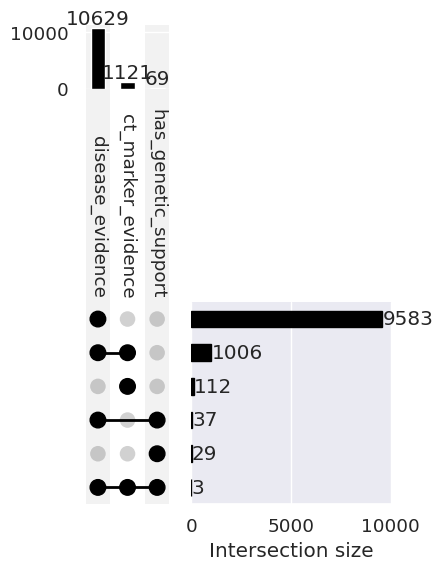

In [261]:
targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']
evidence_cols = ['ct_marker_evidence', 'disease_evidence', 'has_genetic_support']
evidence_sets_dict = {}
for ev in evidence_cols:
    evidence_sets_dict[ev] = targets_res_coarse.target_disease[
        (targets_res_coarse[ev] == 1)
    ].tolist()

evidence_upset = upsetplot.from_contents(evidence_sets_dict)

pl = upsetplot.UpSet(
    evidence_upset, 
    orientation='vertical', 
    show_counts = '{:d}', 
    sort_categories_by='cardinality',
    sort_by='cardinality', 
)
pl.plot()

### SLE

In [83]:
disease_ontology_id = 'MONDO_0007915'

In [84]:
data_dir ='../data/'

In [85]:
pbulk_adata_coarse = sc.read_h5ad(data_dir + f'cellxgene_targets_{disease_ontology_id.replace(":", "_")}.pbulk_all_genes.h5ad', backed=True)
# pbulk_adata_coarse = _process_pbulk(pbulk_adata_coarse)
pbulk_adata_coarse[pbulk_adata_coarse.obs['disease'] != 'normal'].obs.donor_id.nunique()


162

In [86]:
gene_names_df = pbulk_adata_coarse.var[['feature_name', 'feature_id']].copy()
gene_names_df.columns = ['gene_name', 'gene_id']

In [87]:
## Read results with coarse annotations
targets_res_coarse = targets_evidence_all[targets_evidence_all.disease_ontology_id == disease_ontology_id]
targets_res_coarse = targets_res_coarse[targets_res_coarse.gene_id.isin(universe_dict['protein_coding_targets'])].copy()

DE_res_coarse = pd.read_csv(f'../data/DE_diseasecelltype_{disease_ontology_id}.hvgs.csv')
DE_ct_res_coarse = pd.read_csv(f'../data/DE_celltype_{disease_ontology_id}.hvgs.csv')

In [88]:
import decoupler as dc
msigdb = dc.get_resource('MSigDB')

In [102]:
ifn_gamma_genes = msigdb[msigdb['geneset'] == 'HALLMARK_INTERFERON_GAMMA_RESPONSE'].genesymbol.sort_values()

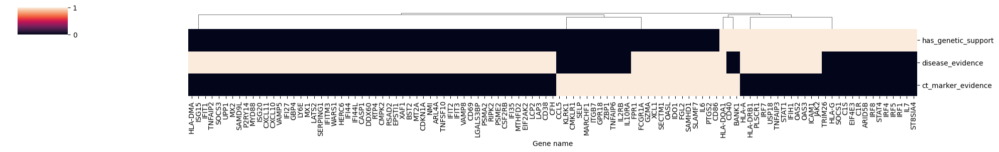

In [90]:
ifn_genes_results = targets_res_coarse[targets_res_coarse.gene_name.isin(ifn_gamma_genes)].set_index('gene_name')[evidence_cols]
ifn_genes_results = ifn_genes_results[ifn_genes_results.sum(1) > 0].copy()
ifn_genes_results.index.name = 'Gene name'
sns.clustermap(
    ifn_genes_results.T, row_cluster=False, xticklabels=True, figsize=(20,3));
plt.savefig(figdir + 'IFNg_genes_SLE.png');
plt.savefig(figdir + 'IFNg_genes_SLE.pdf')


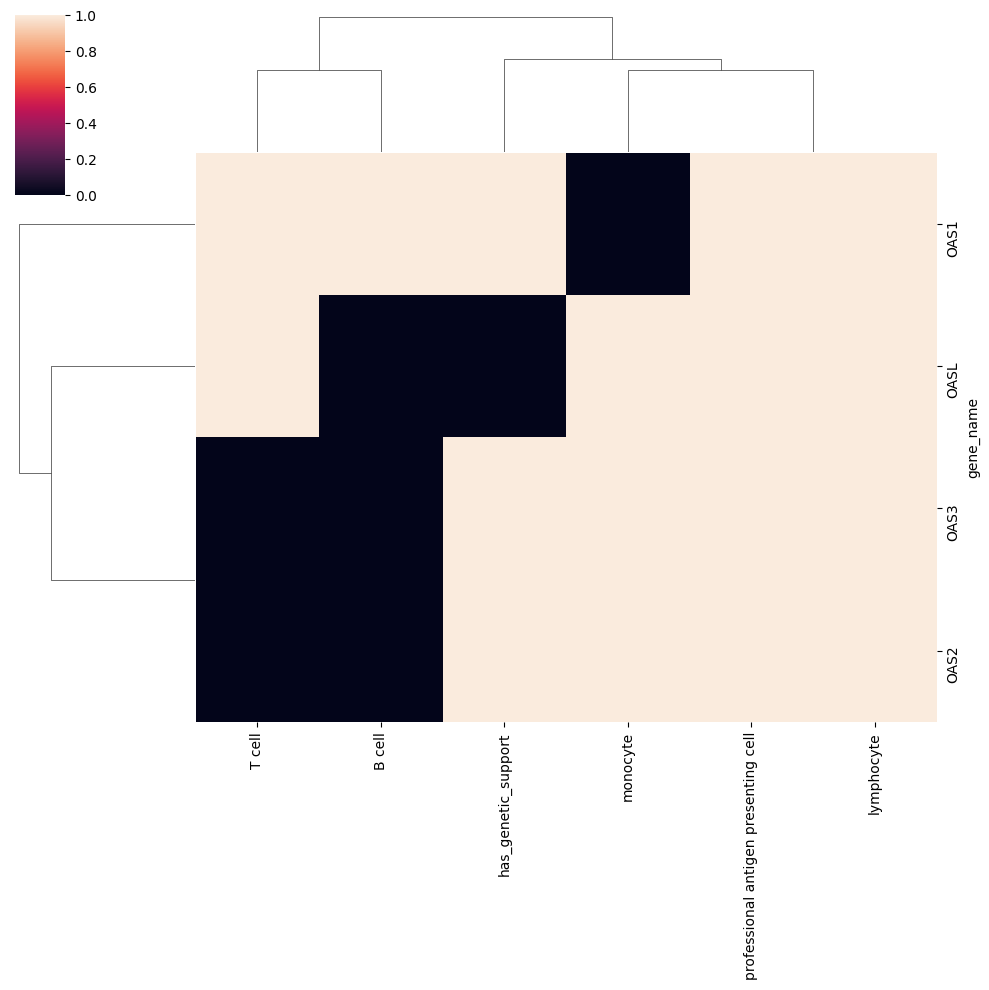

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


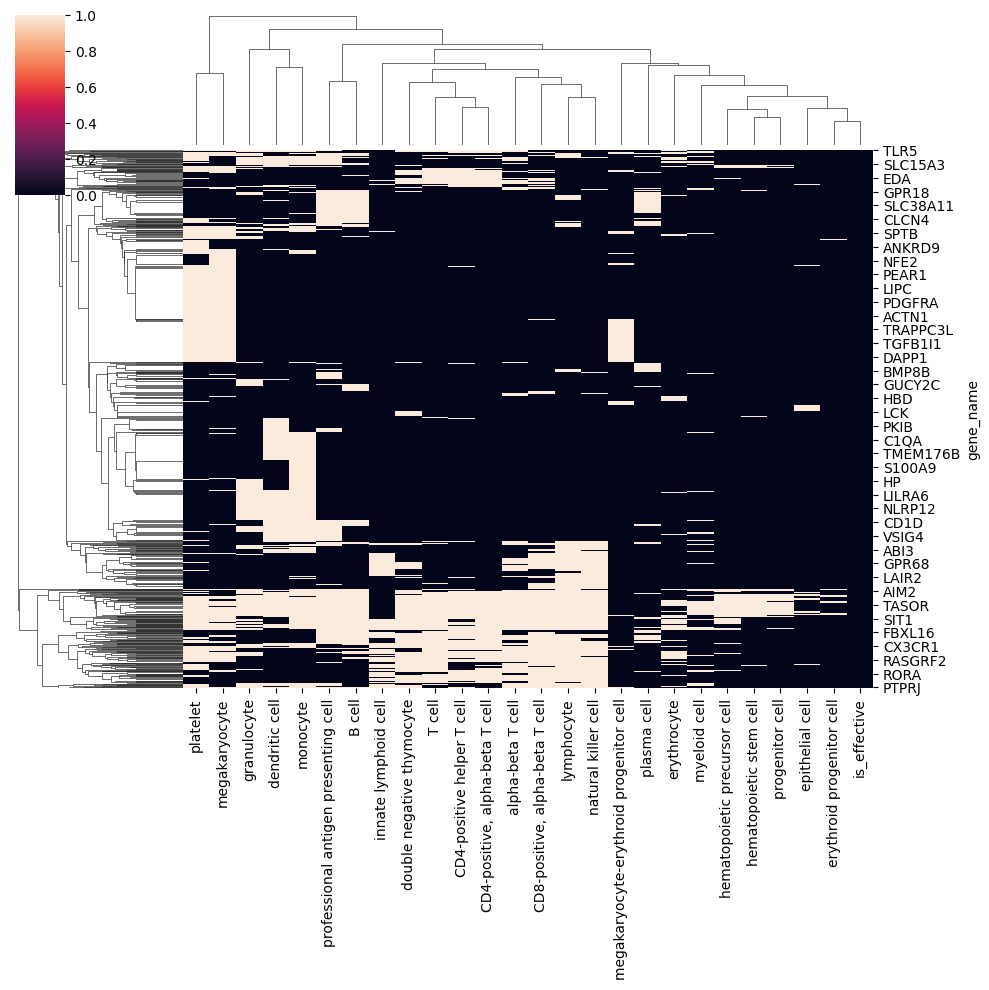

In [91]:
select_gene_ids = targets_res_coarse.gene_id[targets_res_coarse.is_safe!=1]
hm_disease = get_evidence_celltypes(
    DE_res_coarse[DE_res_coarse.gene_id.isin(select_gene_ids)],
    targets_res_coarse, evidence='disease', clinical_status_cols=['has_genetic_support'])

hm_ct = get_evidence_celltypes(
    DE_ct_res_coarse[DE_ct_res_coarse.gene_id.isin(select_gene_ids)], 
    targets_res_coarse, evidence='celltype')

sns.clustermap(hm_disease[hm_disease.index.str.startswith("OAS")])
plt.show()
sns.clustermap(hm_ct)

In [92]:
success_cols = ['is_safe','is_effective', 'is_approved']
cluster_clinical_status = True
evidence_cols = ['has_genetic_support', 'disease_evidence', 'ct_marker_evidence']

## -- Get info on explored targets -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 1][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
row_order = pl_df.sort_values(['gene_class'] + evidence_cols).gene_name.unique().tolist() # Order by gene class

# Group targets by highest success
pl_df['success_group'] = np.where(
    (pl_df.is_safe == 1) & (pl_df.is_effective == 0), 'safe',
    np.where((pl_df.is_approved == 0) & (pl_df.is_effective == 1), 'effective', 'approved'))

targets_pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class', 'success_group']).copy()
targets_pl_df['col_class'] = np.where(targets_pl_df['variable'].isin(evidence_cols), 'evidence', 'drug target\nclass')

## -- Get fraction of unexplored targets by class -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 0][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class'])
frac_pl_df = pl_df[pl_df.value == 1].groupby(['variable','gene_class']).sum().reset_index()

/tmp/ipykernel_5643/1740083542.py:7: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5643/1740083542.py:20: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5643/1740083542.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


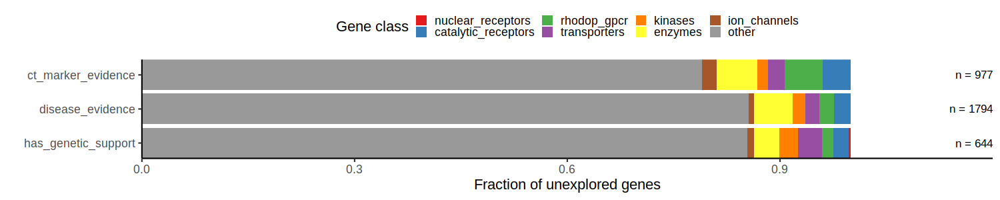

In [93]:
%%R -i targets_pl_df -i frac_pl_df -i evidence_cols -i row_order -w 1500 -h 300
# lapply(c('safe', 'effective', 'approved'), function(success_col){ 
pl1 <- targets_pl_df %>%
    filter(value == 1) %>%
    mutate(variable = factor(variable, levels=c(unlist(evidence_cols), 'is_approved', 'is_effective', 'is_safe'))) %>%
    arrange(variable) %>%
    mutate(gene_name=factor(gene_name, levels=row_order)) %>%
    ggplot(aes(gene_name, variable)) +
    geom_tile() +
    geom_tile(data=. %>% group_by(gene_name) %>% mutate(variable='target_class', col_class=''), aes(fill=gene_class)) +
    facet_grid(col_class~success_group, scales='free', space='free') +
    scale_fill_manual(values=gene_class_palette, name='Gene class') +
    theme_classic(base_size=22) +
    ylab('Cell type label') + xlab('Drug target gene') +
    guides(fill='none') +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5, size=10), 
          strip.text.y = element_text(angle=0, hjust=0),
          strip.background = element_rect(fill = "transparent", color=NA),
           strip.placement = "outside",
            panel.border = element_rect(color = "black", fill = NA)) 

pl1 + ggsave_figdir('SLE_explored_targets', width=25, height=5)

pl2 <- frac_pl_df %>%
    mutate(variable = factor(variable, levels=c('has_genetic_support', 'disease_evidence', 'ct_marker_evidence'))) %>%
    group_by(variable) %>%
    mutate(n = sum(value)) %>%
    ggplot(aes(variable, value)) +
    geom_col(aes(fill=gene_class), position='fill') +
    geom_text(data = . %>% distinct(n, variable),
              aes(y=1.2, label=paste('n =', n)), size=6, hjust=1) +
    scale_fill_manual(values=gene_class_palette, name='Gene class') +
    theme_classic(base_size=22) +
    ylab('Fraction of unexplored genes') + xlab('') +
    coord_flip(expand=FALSE) +
    theme(legend.position='top')

pl2 + ggsave_figdir('SLE_fraction_unexplored', width=12, height=3)

In [94]:
all_other_enr = pd.DataFrame()
evidence_cols = ['has_genetic_support', 'disease_evidence', 'ct_marker_evidence']

for ev in evidence_cols:
    other_enr = enrichment_analysis(
        targets_res_coarse, 
        filter_evidence = dict({(x,1) if x==ev else (x,0) for x in evidence_cols}), 
        filter_gene_class=['other'],
        fdr_alpha=1
    )
    other_enr['evidence'] = ev
    all_other_enr = pd.concat([all_other_enr, other_enr])


/tmp/ipykernel_5643/1319502530.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_enr['evidence'] = ev


In [95]:
other_enr = enrichment_analysis(
        targets_res_coarse, 
        filter_evidence = dict({(x,1) if x != 'ct_marker_evidence' else (x,0)for x in evidence_cols}), 
        filter_gene_class=['other'],
        fdr_alpha=1
    )
other_enr['evidence'] = 'genetics AND disease'
all_other_enr = pd.concat([all_other_enr, other_enr])

/tmp/ipykernel_5643/779753136.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_enr['evidence'] = 'genetics AND disease'


In [96]:
all_other_enr['top10_genes'] = [';'.join(x[0:10]) for x in all_other_enr['genes'].str.split(";")]
all_other_enr_signif = all_other_enr[all_other_enr['adj_pval'] < 0.1]

# gen_enr = all_other_enr[all_other_enr.evidence == 'has_genetic_support'].copy()
# np.unique(sum(gen_enr['genes'].str.split(";", expand=False).values, []))

In [97]:
# def _term2gene_cont(df):
#     df['genes'] = [x[0].split(";") for x in df['genes']]
#     # Step 2: Create a list of all unique genes
#     all_genes = list(set(gene for genes_list in df['genes'] for gene in genes_list))

#     # Step 3: Create the binary contingency table
#     contingency_table = pd.DataFrame(0, index=df['term'], columns=all_genes)

#     # Fill in the contingency table based on associations
#     for term, genes_list in zip(df['term'], df['genes']):
#         contingency_table.loc[term, genes_list] = 1
#     return(contingency_table)

# # sns.clustermap(_term2gene_cont(gen_enr[['term', 'genes']]), xticklabels=True, figsize=(18,4), row_cluster=False)
# # gen_enr[['term', 'genes']]
# all_other_enr_signif[["HLA" in x for x in all_other_enr_signif['genes']]][['term', 'genes']]

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


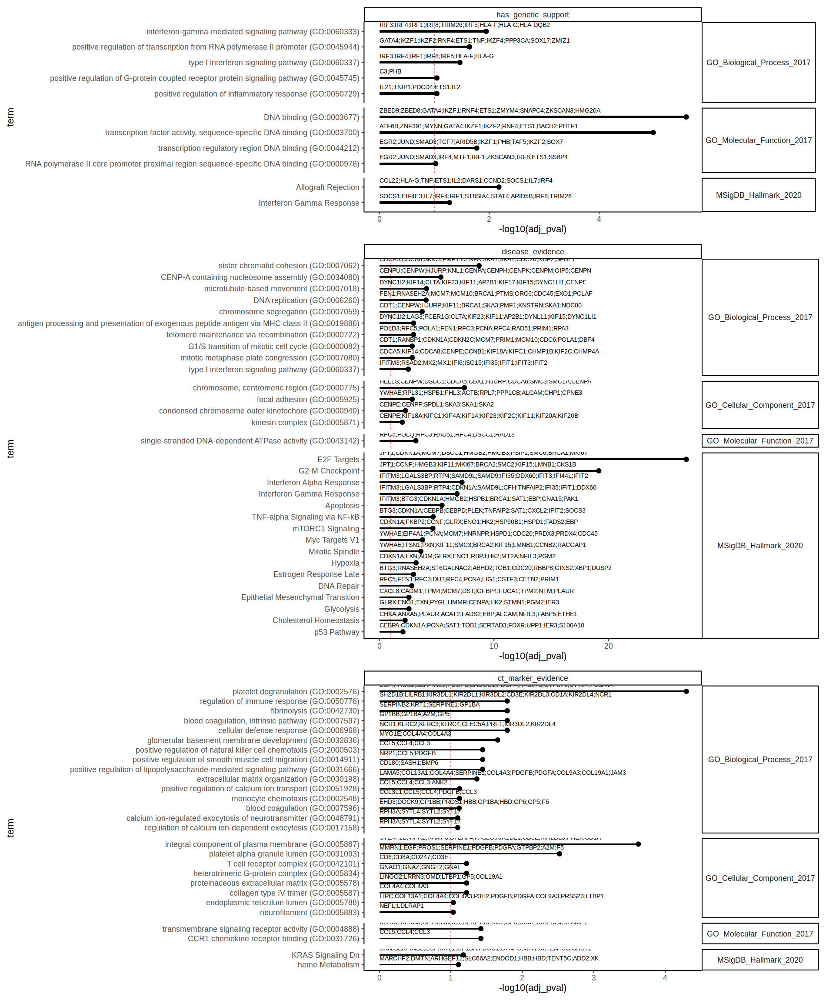

In [98]:
%%R -i all_other_enr_signif -w 1900 -h 2300 
p1 <- all_other_enr_signif %>%
    filter(evidence == 'has_genetic_support') %>%
    arrange( - adj_pval) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 
p2 <- all_other_enr_signif %>%
    filter(evidence == 'disease_evidence') %>%
    filter(adj_pval < 0.01) %>%
#     slice_min(adj_pval, n=10) %>%
    arrange( - adj_pval) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 
p3 <- all_other_enr_signif %>%
    filter(evidence == 'ct_marker_evidence') %>%
#     slice_min(adj_pval, n=10) %>%
    arrange( - adj_pval) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 
    
(p1 / p2 / p3) +
plot_layout(heights=c(1,2,1.5))

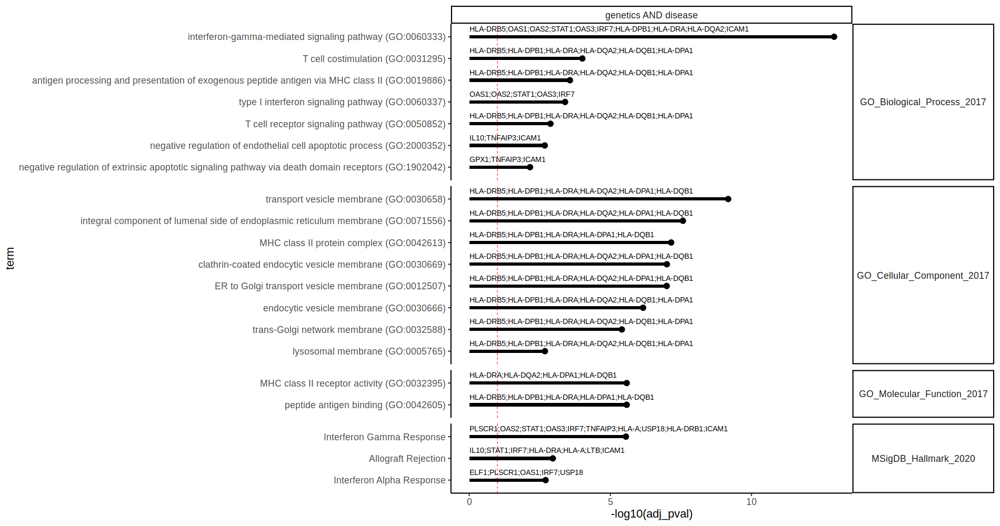

In [99]:
%%R -w 1900 -h 1000
all_other_enr_signif %>%
    filter(evidence == 'genetics AND disease') %>%
    filter(adj_pval < 0.01) %>%
#     slice_min(adj_pval, n=10) %>%
    arrange( - adj_pval) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 

- Genetic evidence shows DNA binding genes
- Disease evidence: cell cycle, DNA replication, IFITM3 (used for prognosis https://www.cell.com/cell/fulltext/S0092-8674(16)30264-1?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0092867416302641%3Fshowall%3Dtrue)

Both associated to interferon response, but TFs for genetic evidence (IRF genes) and effectors (IFIT genes) for DE in disease evidence.

- Cell type evidence: complement, IG genes, chemokines, glomerular components - membrane and secreted proteins

In [26]:
# success_cols = ['is_effective', 'is_approved', 'has_genetic_support']
# cluster_clinical_status = True

# keep_targets = targets_res_coarse[targets_res_coarse['is_effective'] == 1].gene_id
# df_ct = get_evidence_celltypes(DE_ct_res_coarse[DE_ct_res_coarse.gene_id.isin(keep_targets)], targets_res_coarse,
#                        clinical_status_cols = success_cols, evidence='celltype'
#                       )
# missing_genes = np.setdiff1d(gene_names_df.gene_name[gene_names_df.gene_id.isin(keep_targets)].values, df_ct.index)
# for t in missing_genes:
#     df_ct.loc[t] = 0
#     t_id = gene_names_df.set_index('gene_name').loc[t][0]
#     for col in success_cols:
#         df_ct.loc[t, col] = targets_res_coarse.loc[targets_res_coarse.gene_id == t_id, col].values

# df_dis = get_evidence_celltypes(DE_res_coarse[DE_res_coarse.gene_id.isin(keep_targets)], targets_res_coarse,
#                        clinical_status_cols = success_cols, evidence='disease'
#                       )
# missing_genes = np.setdiff1d(gene_names_df.gene_name[gene_names_df.gene_id.isin(keep_targets)].values, df_dis.index)
# for t in missing_genes:
#     df_dis.loc[t] = 0
#     t_id = gene_names_df.set_index('gene_name').loc[t][0]
#     for col in success_cols:
#         df_dis.loc[t, col] = targets_res_coarse.loc[targets_res_coarse.gene_id == t_id, col].values

# # Get the row orders
# cl_df = pd.concat([df_dis.drop(success_cols, 1), df_ct.drop(success_cols, 1)], axis=1)
# cluster = sns.clustermap(cl_df, metric='jaccard', col_cluster=False)
# row_order = cl_df.index[cluster.dendrogram_row.reordered_ind]

# df_ct = df_ct.reset_index().melt( ['gene_name'] , var_name='celltype')
# df_ct['evidence'] = 'celltype_marker'        
# df_dis = df_dis.reset_index().melt( ['gene_name'] , var_name='celltype')
# df_dis['evidence'] = 'disease'

# pl_df = pd.concat([df_dis, df_ct])
# pl_df['evidence'] = np.where(pl_df.celltype.isin(success_cols), 'clinical status', pl_df['evidence'])
# pl_df['evidence'] = np.where(pl_df.celltype == ('has_genetic_support'), 'genetic support', pl_df['evidence'])

# if cluster_clinical_status:
#     pl_df['target_success'] = 'is_effective'
#     for c in success_cols:
#         print(c)
#         pl_df['target_success'] = np.where(pl_df.gene_name.isin(pl_df.gene_name[(pl_df.celltype == c) & (pl_df.value == 1)]), c, pl_df['target_success'])
# else:
#     pl_df['target_success'] = 'targets'

    
# pl_df['target_class'] = [reversed_annos[x] if x in reversed_annos.keys() else np.nan for x in pl_df.gene_name]

# target_df = pl_df[['gene_name', 'target_class']].drop_duplicates()
# target_df.columns = ['gene_name', 'value']
# target_df['celltype'] = 'target_class'
# target_df['evidence'] = 'target_class'
# pl_df = pd.concat([pl_df, target_df]).drop('target_class', 1)

# pl_df.loc[pl_df.value == 1, 'value'] = 'yes'
# pl_df = pl_df[pl_df.value != 0].copy()

# ct_order_coarse = pl_df.celltype[pl_df['evidence'].isin(['celltype_marker', 'disease'])].unique()

# %%R -i pl_df -i ct_order_coarse -i row_order -i success_cols 
# head(pl_df)

# %%R -w 1500 -h 600
# pl_df %>%
#     filter(celltype != 'malignant cell') %>%
#     mutate(evidence = factor(evidence, levels=c('clinical status','celltype_marker', 'disease','genetic support',  'target_class'))) %>%
#     mutate(celltype = factor(celltype, levels=c('target_class', rev(ct_order_coarse), success_cols))) %>%
#     mutate(gene_name = factor(gene_name, levels=row_order)) %>%
#     ggplot(aes(gene_name, celltype)) +
#     geom_tile(data = . %>% filter(evidence != 'target_class'),fill='grey50') +
#     geom_tile(data = . %>% filter(evidence == 'clinical status'),
#               fill='firebrick') +
#     geom_point(data = . %>% filter(celltype == 'target_class' & !is.na(value)), 
#                aes(color=value), size=3) +
#     facet_grid(evidence~., scales='free', space='free') +
#     scale_color_brewer(palette='Set1', name='Target class') +
#     theme_bw(base_size=16) +
#     ylab('Cell type label') + xlab('Drug target gene') +
#     theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5), 
#           strip.text.y = element_text(angle=0, hjust=0),
#           strip.background = element_rect(fill = "transparent", color=NA),
#            strip.placement = "outside",
#             panel.border = element_rect(color = "black", fill = NA)
#          )

# targets_res_coarse.sum()

### Myocardial infarction

In [162]:
disease_ontology_id = 'MONDO_0005068'

In [163]:
pbulk_adata_coarse = sc.read_h5ad(data_dir + f'cellxgene_targets_{disease_ontology_id.replace(":", "_")}.pbulk_all_genes.h5ad', backed=True)
# pbulk_adata_coarse = _process_pbulk(pbulk_adata_coarse)
pbulk_adata_coarse[pbulk_adata_coarse.obs['disease'] != 'normal'].obs.donor_id.nunique()


19

In [164]:
gene_names_df = pbulk_adata_coarse.var[['feature_name', 'feature_id']].copy()
gene_names_df.columns = ['gene_name', 'gene_id']

In [165]:
## Read results with coarse annotations
targets_res_coarse = targets_evidence_all[targets_evidence_all.disease_ontology_id == disease_ontology_id]
DE_res_coarse = pd.read_csv(f'../data/DE_diseasecelltype_{disease_ontology_id}.hvgs.csv')
DE_ct_res_coarse = pd.read_csv(f'../data/DE_celltype_{disease_ontology_id}.hvgs.csv')

In [166]:
targets_res_coarse.sum()

/tmp/ipykernel_5884/3764932892.py:1: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  targets_res_coarse.sum()


Unnamed: 0.1                                                      1358949717
Unnamed: 0                                                        1358949717
gene_id                    ENSG00000001084ENSG00000005961ENSG00000007314E...
disease_ontology_id        MONDO_0005068MONDO_0005068MONDO_0005068MONDO_0...
genetic_association                                                90.361107
known_drug                                                          68.49893
is_druggable                                                           123.0
is_safe                                                                119.0
is_effective                                                           101.0
is_approved                                                             43.0
has_genetic_support                                                    367.0
ct_marker_evidence                                                     872.0
bulk_disease_evidence                                                 1255.0

In [167]:
success_cols = ['is_safe','is_effective', 'is_approved']
cluster_clinical_status = True
evidence_cols = ['has_genetic_support', 'disease_evidence', 'ct_marker_evidence']

## -- Get info on explored targets -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 1][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
row_order = pl_df.sort_values(['gene_class'] + evidence_cols).gene_name.unique().tolist() # Order by gene class

# Group targets by highest success
pl_df['success_group'] = np.where(
    (pl_df.is_safe == 1) & (pl_df.is_effective == 0), 'safe',
    np.where((pl_df.is_approved == 0) & (pl_df.is_effective == 1), 'effective', 'approved'))

targets_pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class', 'success_group']).copy()
targets_pl_df['col_class'] = np.where(targets_pl_df['variable'].isin(evidence_cols), 'evidence', 'drug target\nclass')

## -- Get fraction of unexplored targets by class -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 0][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class'])
frac_pl_df = pl_df[pl_df.value == 1].groupby(['variable','gene_class']).sum().reset_index()

/tmp/ipykernel_5884/1740083542.py:7: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5884/1740083542.py:20: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5884/1740083542.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


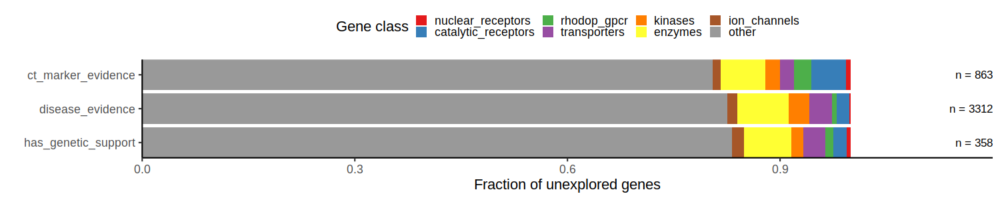

In [168]:
%%R -i targets_pl_df -i frac_pl_df -i evidence_cols -i row_order -w 1500 -h 300
# lapply(c('safe', 'effective', 'approved'), function(success_col){ 
pl1 <- targets_pl_df %>%
    mutate(value= ifelse(value==1, '1', NA)) %>%
    mutate(variable = factor(variable, levels=c(unlist(evidence_cols), 'is_approved', 'is_effective', 'is_safe'))) %>%
    arrange(variable) %>%
    mutate(gene_name=factor(gene_name, levels=row_order)) %>%
    ggplot(aes(gene_name, variable)) +
    geom_tile(aes(fill=value)) +
    geom_point(data=. %>% group_by(gene_name) %>% mutate(variable='target_class', col_class=''), aes(color=gene_class), 
               shape=15, size=3) +
    facet_grid(col_class~success_group, scales='free', space='free') +
    scale_color_manual(values=gene_class_palette, name='Gene class') +
    scale_fill_manual(values=c('black'), na.value="white") +
    theme_classic(base_size=22) +
    ylab('Cell type label') + xlab('Drug target gene') +
    guides(fill='none', color='none') +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5, size=10), 
          strip.text.y = element_text(angle=0, hjust=0),
          strip.background = element_rect(fill = "transparent", color=NA),
           strip.placement = "outside",
            panel.border = element_rect(color = "black", fill = NA)) 

pl1 + ggsave_figdir('MyoInfarction_explored_targets', width=27, height=5)

pl2 <- frac_pl_df %>%
    mutate(variable = factor(variable, levels=c('has_genetic_support', 'disease_evidence', 'ct_marker_evidence'))) %>%
    group_by(variable) %>%
    mutate(n = sum(value)) %>%
    ggplot(aes(variable, value)) +
    geom_col(aes(fill=gene_class), position='fill') +
    geom_text(data = . %>% distinct(n, variable),
              aes(y=1.2, label=paste('n =', n)), size=6, hjust=1) +
    scale_fill_manual(values=gene_class_palette, name='Gene class') +
    theme_classic(base_size=22) +
    ylab('Fraction of unexplored genes') + xlab('') +
    coord_flip(expand=FALSE) +
    theme(legend.position='top')

pl2 + ggsave_figdir('MyoInfarction_fraction_unexplored', width=12, height=3)

In [80]:
pl_df = targets_res_coarse.groupby('gene_class').sum()[['disease_evidence', 'ct_marker_evidence', 'is_approved', 'has_genetic_support']]
pl_df = pl_df.reset_index().melt('gene_class', var_name='evidence', value_name='n_targets')

/tmp/ipykernel_3645/1115066195.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  pl_df = targets_res_coarse.groupby('gene_class').sum()[['disease_evidence', 'ct_marker_evidence', 'is_approved', 'has_genetic_support']]


/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


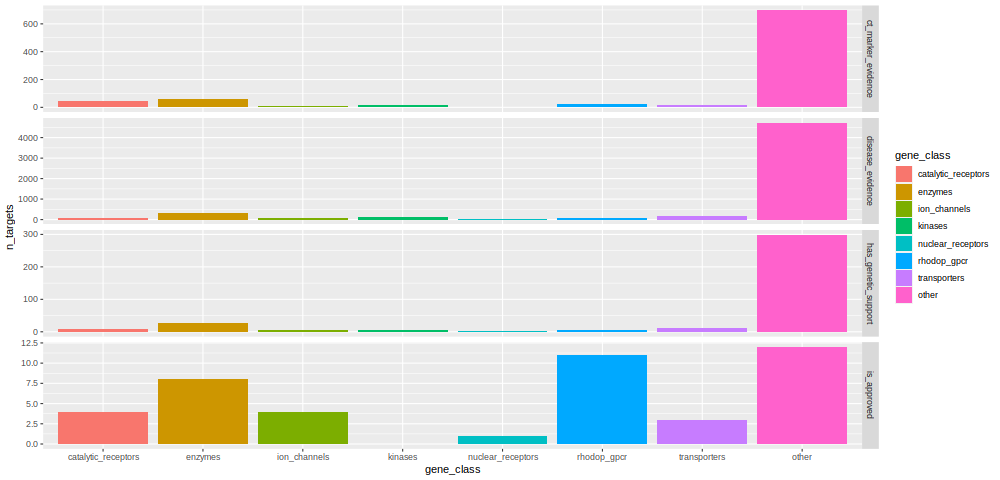

In [81]:
%%R -i pl_df -w 1000
pl_df %>%
filter(n_targets != 0 ) %>%
mutate(gene_class= factor(gene_class, levels=c('catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
       'nuclear_receptors', 'rhodop_gpcr', 'transporters', 'other'))) %>%
ggplot(aes(gene_class, n_targets, fill=gene_class)) +
geom_col() +
facet_grid(evidence~., scales='free')

In [82]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.disease_evidence == 1)].unique()].gene_name.tolist()
background = DE_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [83]:
enr.results[enr.results['Adjusted P-value'] < 0.01]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Allograft Rejection,1.309619e-06,6.548097e-05,0,0,2.055207,27.839364,CD86;SPI1;CSF1;GPR65;NCF4;PRF1;LY75;RPL9;TNF;E...
1,MSigDB_Hallmark_2020,UV Response Dn,8.721794e-06,2.180448e-04,0,0,2.121367,24.713262,NRP1;CELF2;ITGB3;SERPINE1;PTPRM;PTPN21;PIK3CD;...
2,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,2.570020e-05,4.000327e-04,0,0,1.846459,19.515248,CSF1;SERPINE1;TNC;TNF;ETS2;IFIT2;ZFP36;CCND1;P...
3,MSigDB_Hallmark_2020,Epithelial Mesenchymal Transition,3.262455e-05,4.000327e-04,0,0,1.822148,18.823598,COL16A1;SERPINE1;COL12A1;TNC;PLOD2;PLOD1;LOXL2...
4,MSigDB_Hallmark_2020,Inflammatory Response,4.000327e-05,4.000327e-04,0,0,1.833073,18.562701,RTP4;CXCL6;IFITM1;CDKN1A;BTG2;CSF3R;CSF1;ITGB3...
5,MSigDB_Hallmark_2020,Interferon Gamma Response,7.046329e-05,5.871941e-04,0,0,1.789532,17.108676,IFITM3;CD86;LGALS3BP;RTP4;CDKN1A;IFITM2;BTG1;T...
6,MSigDB_Hallmark_2020,Estrogen Response Early,1.348943e-04,9.635304e-04,0,0,1.751615,15.608676,SCARB1;FCMR;CLIC3;NXT1;MAST4;ABAT;CELSR1;AQP3;...
7,MSigDB_Hallmark_2020,Angiogenesis,1.555039e-04,9.718995e-04,0,0,4.031093,35.348007,LRPAP1;APP;NRP1;CXCL6;POSTN;LUM;FSTL1;PTK2;SER...
8,MSigDB_Hallmark_2020,Oxidative Phosphorylation,1.822748e-04,1.012638e-03,0,0,1.705812,14.687031,COX6A1;TOMM22;PDK4;ATP6V1G1;CPT1A;ECH1;SDHD;CO...
9,MSigDB_Hallmark_2020,IL-2/STAT5 Signaling,2.034402e-04,1.017201e-03,0,0,1.708321,14.520969,IFITM3;CDKN1C;CD86;CYFIP1;NRP1;GUCY1B1;BMPR2;C...


In [84]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.has_genetic_support == 1) & (targets_res_coarse.gene_class == 'other')].unique()].gene_name.tolist()
background = DE_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [85]:
enr.results[enr.results['Adjusted P-value'] < 0.01]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
41,GO_Biological_Process_2017,negative regulation of transcription from RNA ...,0.000012,0.00991,0,0,3.424887,38.727164,MEF2A;SMAD3;ZHX3;DAB2IP;TCF21;TWIST1;WWP2;PHB;...


In [86]:
gene_list = gene_names_df.loc[targets_res_coarse.gene_id[(targets_res_coarse.ct_marker_evidence == 1)].unique()].gene_name.tolist()
background = DE_ct_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [87]:
enr.results[enr.results['Adjusted P-value'] < 0.01]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Allograft Rejection,2.336877e-21,1.098332e-19,0,0,6.163546,292.802159,CD86;ITK;GPR65;NCF4;ITGB2;PRF1;CD3G;FASLG;CD3E...
1,MSigDB_Hallmark_2020,Interferon Gamma Response,4.644096e-10,1.043570e-08,0,0,3.752690,80.646261,CD86;CIITA;MARCHF1;CFH;TNFAIP6;FGL2;FPR1;NLRC5...
2,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,7.738587e-10,1.043570e-08,0,0,3.478013,72.967423,PTGER4;NFAT5;CEBPB;CD83;PFKFB3;TNFAIP6;BCL2A1;...
3,MSigDB_Hallmark_2020,Inflammatory Response,8.881448e-10,1.043570e-08,0,0,3.402067,70.905500,CSF3R;CXCL8;TNFAIP6;AQP9;CX3CL1;ICAM1;GPR132;I...
4,MSigDB_Hallmark_2020,KRAS Signaling Up,7.863583e-07,7.391768e-06,0,0,2.772191,38.965517,CFH;FLT4;RGS16;ITGB2;SEMA3B;CXCR4;F13A1;LY96;T...
5,MSigDB_Hallmark_2020,Complement,1.987287e-05,1.556708e-04,0,0,2.533181,27.424608,FCN1;C1QA;CPM;CEBPB;ITGAM;CFH;DOCK9;NOTCH4;PDG...
6,MSigDB_Hallmark_2020,IL-2/STAT5 Signaling,1.478095e-04,9.924351e-04,0,0,2.259737,19.929947,CD86;CD83;PTGER2;GPR65;RGS16;FGL2;PTH1R;CST7;C...
7,MSigDB_Hallmark_2020,IL-6/JAK/STAT3 Signaling,5.661947e-04,3.326394e-03,0,0,2.851114,21.316558,CCR1;CSF3R;PLA2G2A;CSF2RB;IL2RG;TNF;CSF2RA;PIK...
8,MSigDB_Hallmark_2020,Myogenesis,8.351402e-04,4.361288e-03,0,0,2.027137,14.368166,CFD;ITGB4;LDB3;LSP1;FGF2;CLU;MYOM2;MYLK;CSRP3;...
47,GO_Biological_Process_2017,regulation of immune response (GO:0050776),1.126984e-17,1.729920e-14,0,0,7.169109,279.770179,SIGLEC9;ITGB2;ICAM2;ICAM3;CD3G;SLA2;CD3E;ITGAL...


/tmp/ipykernel_3645/2103994140.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']


{'matrix': <AxesSubplot: >,
 'shading': <AxesSubplot: >,
 'totals': <AxesSubplot: >,
 'intersections': <AxesSubplot: xlabel='Intersection size'>}

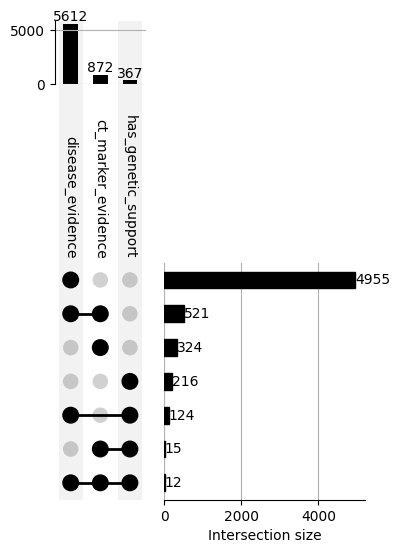

In [88]:
targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']
evidence_cols = ['ct_marker_evidence', 'disease_evidence', 'has_genetic_support']
evidence_sets_dict = {}
for ev in evidence_cols:
    evidence_sets_dict[ev] = targets_res_coarse.target_disease[
        (targets_res_coarse[ev] == 1)
    ].tolist()

evidence_upset = upsetplot.from_contents(evidence_sets_dict)

pl = upsetplot.UpSet(
    evidence_upset, 
    orientation='vertical', 
    show_counts = '{:d}', 
    sort_categories_by='cardinality',
    sort_by='cardinality', 
)
pl.plot()

In [89]:
gene_ids = targets_res_coarse.gene_id[(targets_res_coarse.has_genetic_support != 1) & (targets_res_coarse.disease_evidence == 1) & (targets_res_coarse.ct_marker_evidence == 1)].unique()
gene_list = gene_names_df.loc[[x for x in gene_ids if x in gene_names_df.index]].gene_name.tolist()
gene_list = [x for x in gene_list if not x.startswith("ENS")]
background = DE_ct_res_coarse.gene_name.unique()

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=gene_list,
                 gene_sets=gene_sets,
                 organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                 background=background,
                 outdir='./enrichr/',
                 # no_plot=True,
                 cutoff=1.0 # test dataset, use lower value from range(0,1)
                )

In [90]:
targets_res_coarse[targets_res_coarse['gene_id'].isin(gene_ids)].sum()

Unnamed: 0.1                                                        48460381
Unnamed: 0                                                           3732010
gene_id                    ENSG00000088832ENSG00000092009ENSG00000095303E...
disease_ontology_id        MONDO_0005068MONDO_0005068MONDO_0005068MONDO_0...
genetic_association                                                      0.0
known_drug                                                          3.824226
is_druggable                                                             7.0
is_safe                                                                  7.0
is_effective                                                             5.0
is_approved                                                              2.0
has_genetic_support                                                      0.0
ct_marker_evidence                                                     521.0
bulk_disease_evidence                                                  212.0

In [91]:
enr.results[enr.results['Adjusted P-value'] < 0.01]

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Allograft Rejection,2.500213e-18,1.050089e-16,0,0,6.265788,253.953373,CD86;ITK;GPR65;NCF4;PRF1;CD3G;FASLG;CD3E;ITGAL...
1,MSigDB_Hallmark_2020,Interferon Gamma Response,1.376445e-06,1.531221e-05,0,0,3.290381,44.407005,CD86;CFH;FGL2;NLRC5;SOCS3;MT2A;SOCS1;CCL5;TNFS...
2,MSigDB_Hallmark_2020,IL-2/STAT5 Signaling,1.428105e-06,1.531221e-05,0,0,3.200391,43.074587,CD86;PTGER2;GPR65;RGS16;FGL2;CST7;CD79B;SOCS1;...
3,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,1.458306e-06,1.531221e-05,0,0,3.121063,41.941577,PTGER4;NFAT5;CEBPB;PFKFB3;CEBPD;AREG;TNF;CXCL2...
4,MSigDB_Hallmark_2020,Inflammatory Response,3.131862e-06,2.630764e-05,0,0,2.979633,37.763525,PTGER4;CSF3R;PTGER2;RGS16;AQP9;C5AR1;CX3CL1;PI...
5,MSigDB_Hallmark_2020,IL-6/JAK/STAT3 Signaling,1.371620e-04,8.575986e-04,0,0,3.658597,32.540832,CSF3R;PLA2G2A;IL2RG;TNF;CSF2RA;PIK3R5;SOCS3;SO...
6,MSigDB_Hallmark_2020,Complement,1.429331e-04,8.575986e-04,0,0,2.621954,23.212509,LYN;FCN1;C1QA;CPM;CEBPB;SERPINB2;FCER1G;CFH;NO...
7,MSigDB_Hallmark_2020,KRAS Signaling Up,2.801768e-04,1.470928e-03,0,0,2.430432,19.881155,CFH;RGS16;CXCR4;LY96;PRDM1;IL2RG;CSF2RA;TMEM10...
42,GO_Biological_Process_2017,regulation of immune response (GO:0050776),8.935336e-12,1.018628e-08,0,0,5.681703,144.548257,KLRB1;ICAM2;ICAM3;CD3G;SLA2;CD3E;ITGAL;CD3D;FC...
43,GO_Biological_Process_2017,T cell activation (GO:0042110),2.188858e-09,8.977278e-07,0,0,15.432446,307.721208,CD86;ITK;TNFSF14;CD3G;NLRC3;CD3E;SLA2;FKBP1A;C...


/tmp/ipykernel_3645/1429685671.py:26: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  cl_df = pd.concat([df_dis.drop(success_cols, 1), df_ct.drop(success_cols, 1)], axis=1)
/tmp/ipykernel_3645/1429685671.py:26: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  cl_df = pd.concat([df_dis.drop(success_cols, 1), df_ct.drop(success_cols, 1)], axis=1)
/tmp/ipykernel_3645/1429685671.py:54: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  pl_df = pd.concat([pl_df, target_df]).drop('target_class', 1)


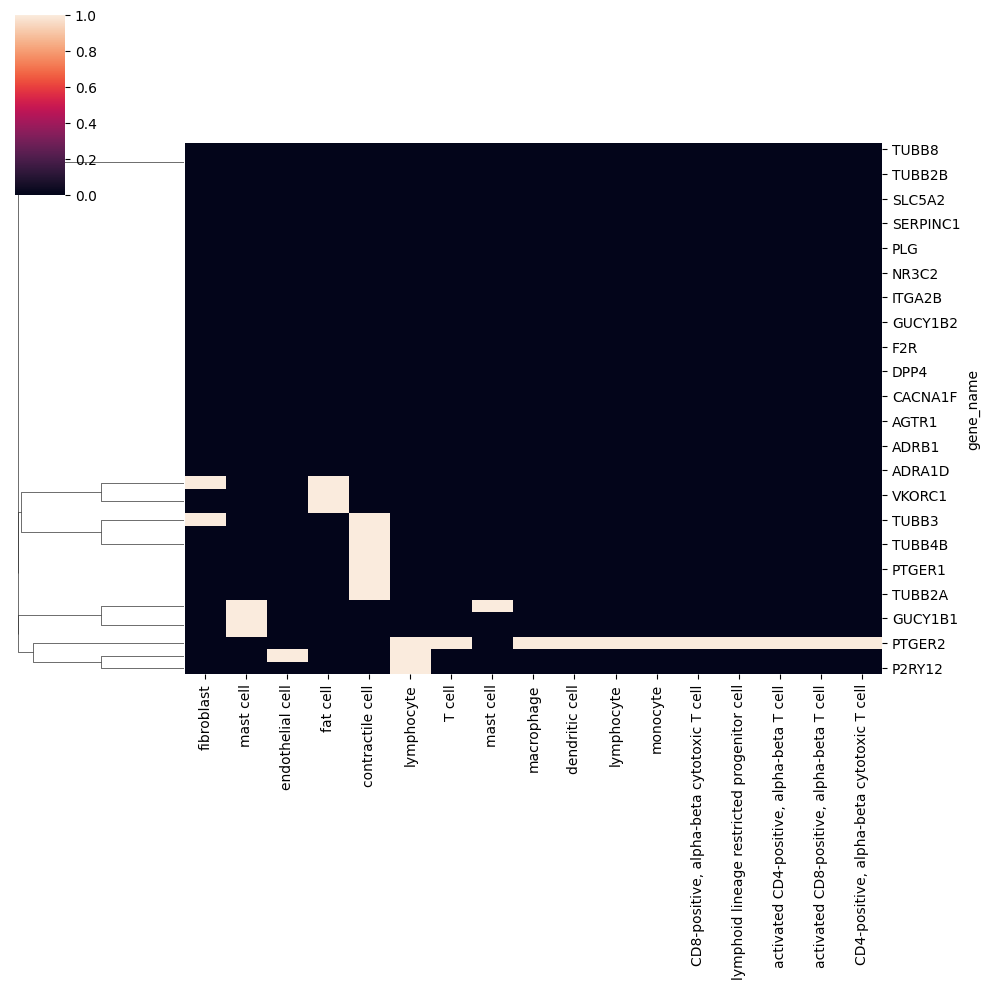

In [96]:
success_cols = ['is_effective', 'is_approved', 'has_genetic_support']
cluster_clinical_status = False

keep_targets = targets_res_coarse[targets_res_coarse['is_approved'] == 1].gene_id
df_ct = get_evidence_celltypes(DE_ct_res_coarse[DE_ct_res_coarse.gene_id.isin(keep_targets)], targets_res_coarse,
                       clinical_status_cols = success_cols, evidence='celltype'
                      )
missing_genes = np.setdiff1d(gene_names_df.gene_name[gene_names_df.gene_id.isin(keep_targets)].values, df_ct.index)
for t in missing_genes:
    df_ct.loc[t] = 0
    t_id = gene_names_df.set_index('gene_name').loc[t][0]
    for col in success_cols:
        df_ct.loc[t, col] = targets_res_coarse.loc[targets_res_coarse.gene_id == t_id, col].values

df_dis = get_evidence_celltypes(DE_res_coarse[DE_res_coarse.gene_id.isin(keep_targets)], targets_res_coarse,
                       clinical_status_cols = success_cols, evidence='disease'
                      )
missing_genes = np.setdiff1d(gene_names_df.gene_name[gene_names_df.gene_id.isin(keep_targets)].values, df_dis.index)
for t in missing_genes:
    df_dis.loc[t] = 0
    t_id = gene_names_df.set_index('gene_name').loc[t][0]
    for col in success_cols:
        df_dis.loc[t, col] = targets_res_coarse.loc[targets_res_coarse.gene_id == t_id, col].values

# Get the row orders
cl_df = pd.concat([df_dis.drop(success_cols, 1), df_ct.drop(success_cols, 1)], axis=1)
cluster = sns.clustermap(cl_df, metric='jaccard', col_cluster=False)
row_order = cl_df.index[cluster.dendrogram_row.reordered_ind]

df_ct = df_ct.reset_index().melt( ['gene_name'] , var_name='celltype')
df_ct['evidence'] = 'celltype_marker'        
df_dis = df_dis.reset_index().melt( ['gene_name'] , var_name='celltype')
df_dis['evidence'] = 'disease'

pl_df = pd.concat([df_dis, df_ct])
pl_df['evidence'] = np.where(pl_df.celltype.isin(success_cols), 'clinical status', pl_df['evidence'])
pl_df['evidence'] = np.where(pl_df.celltype == ('has_genetic_support'), 'genetic support', pl_df['evidence'])

if cluster_clinical_status:
    pl_df['target_success'] = 'is_effective'
    for c in success_cols:
        print(c)
        pl_df['target_success'] = np.where(pl_df.gene_name.isin(pl_df.gene_name[(pl_df.celltype == c) & (pl_df.value == 1)]), c, pl_df['target_success'])
else:
    pl_df['target_success'] = 'targets'

    
pl_df['target_class'] = [reversed_annos[x] if x in reversed_annos.keys() else np.nan for x in pl_df.gene_name]

target_df = pl_df[['gene_name', 'target_class']].drop_duplicates()
target_df.columns = ['gene_name', 'value']
target_df['celltype'] = 'target_class'
target_df['evidence'] = 'target_class'
pl_df = pd.concat([pl_df, target_df]).drop('target_class', 1)

pl_df.loc[pl_df.value == 1, 'value'] = 'yes'
pl_df = pl_df[pl_df.value != 0].copy()

In [97]:
ct_order_coarse = pl_df.celltype[pl_df['evidence'].isin(['celltype_marker', 'disease'])].unique()

In [98]:
%%R -i pl_df -i ct_order_coarse -i row_order -i success_cols 
head(pl_df)

  gene_name         celltype value evidence target_success
1   CACNA1C       fibroblast   yes  disease        targets
2     TUBB3       fibroblast   yes  disease        targets
3   GUCY1B1        mast cell   yes  disease        targets
4     PTGS1        mast cell   yes  disease        targets
5     ADRB2        mast cell   yes  disease        targets
6       ACE endothelial cell   yes  disease        targets


/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


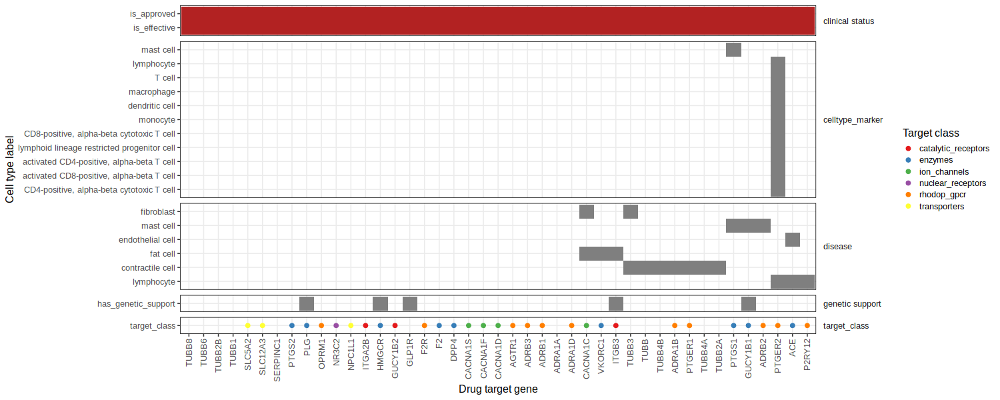

In [99]:
%%R -w 1500 -h 600
pl_df %>%
    filter(celltype != 'malignant cell') %>%
    mutate(evidence = factor(evidence, levels=c('clinical status','celltype_marker', 'disease','genetic support',  'target_class'))) %>%
    mutate(celltype = factor(celltype, levels=c('target_class', rev(ct_order_coarse), success_cols))) %>%
    mutate(gene_name = factor(gene_name, levels=row_order)) %>%
    ggplot(aes(gene_name, celltype)) +
    geom_tile(data = . %>% filter(evidence != 'target_class'),fill='grey50') +
    geom_tile(data = . %>% filter(evidence == 'clinical status'),
              fill='firebrick') +
    geom_point(data = . %>% filter(celltype == 'target_class' & !is.na(value)), 
               aes(color=value), size=3) +
    facet_grid(evidence~., scales='free', space='free') +
    scale_color_brewer(palette='Set1', name='Target class') +
    theme_bw(base_size=16) +
    ylab('Cell type label') + xlab('Drug target gene') +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5), 
          strip.text.y = element_text(angle=0, hjust=0),
          strip.background = element_rect(fill = "transparent", color=NA),
           strip.placement = "outside",
            panel.border = element_rect(color = "black", fill = NA)
         )

### Chronic kidney disease

In [21]:
disease_ontology_id = 'MONDO_0005300'

In [22]:
pbulk_adata_coarse = sc.read_h5ad(data_dir + f'cellxgene_targets_{disease_ontology_id.replace(":", "_")}.pbulk_all_genes.h5ad', backed=True)
# pbulk_adata_coarse = _process_pbulk(pbulk_adata_coarse)
pbulk_adata_coarse[pbulk_adata_coarse.obs['disease'] != 'normal'].obs.donor_id.nunique()


19

In [23]:
gene_names_df = pbulk_adata_coarse.var[['feature_name', 'feature_id']].copy()
gene_names_df.columns = ['gene_name', 'gene_id']

In [24]:
## Read results with coarse annotations
targets_res_coarse = targets_evidence_all[targets_evidence_all.disease_ontology_id == disease_ontology_id]
targets_res_coarse = targets_res_coarse[targets_res_coarse.gene_id.isin(universe_dict['protein_coding_targets'])].copy()

DE_res_coarse = pd.read_csv(f'../data/DE_diseasecelltype_{disease_ontology_id}.hvgs.csv')
DE_ct_res_coarse = pd.read_csv(f'../data/DE_celltype_{disease_ontology_id}.hvgs.csv')

In [25]:
success_cols = ['is_safe','is_effective', 'is_approved']
cluster_clinical_status = True
evidence_cols = ['has_genetic_support', 'disease_evidence', 'ct_marker_evidence']

## -- Get info on explored targets -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 1][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
row_order = pl_df.sort_values(['gene_class'] + evidence_cols).gene_name.unique().tolist() # Order by gene class

# Group targets by highest success
pl_df['success_group'] = np.where(
    (pl_df.is_safe == 1) & (pl_df.is_effective == 0), 'safe',
    np.where((pl_df.is_approved == 0) & (pl_df.is_effective == 1), 'effective', 'approved'))

targets_pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class', 'success_group']).copy()
targets_pl_df['col_class'] = np.where(targets_pl_df['variable'].isin(evidence_cols), 'evidence', 'drug target\nclass')

## -- Get fraction of unexplored targets by class -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 0][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class'])
frac_pl_df = pl_df[pl_df.value == 1].groupby(['variable','gene_class']).sum().reset_index()

/tmp/ipykernel_5884/1740083542.py:7: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5884/1740083542.py:20: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5884/1740083542.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


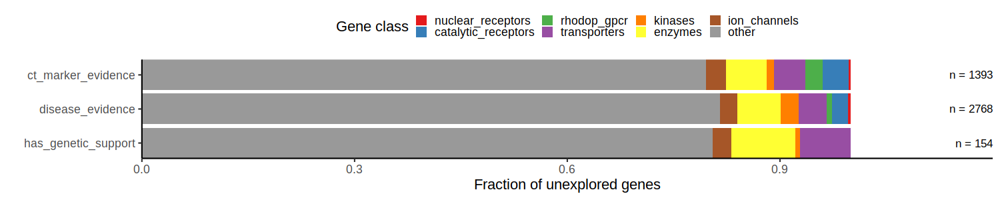

In [186]:
%%R -i targets_pl_df -i frac_pl_df -i evidence_cols -i row_order -w 1500 -h 300
# lapply(c('safe', 'effective', 'approved'), function(success_col){ 
pl1 <- targets_pl_df %>%
    mutate(value= ifelse(value==1, '1', NA)) %>%
    mutate(variable = factor(variable, levels=c(unlist(evidence_cols), 'is_approved', 'is_effective', 'is_safe'))) %>%
    arrange(variable) %>%
    mutate(gene_name=factor(gene_name, levels=row_order)) %>%
    ggplot(aes(gene_name, variable)) +
    geom_tile(aes(fill=value)) +
    geom_point(data=. %>% group_by(gene_name) %>% mutate(variable='target_class', col_class=''), aes(color=gene_class), 
               shape=15, size=3) +
    facet_grid(col_class~success_group, scales='free', space='free') +
    scale_color_manual(values=gene_class_palette, name='Gene class') +
    scale_fill_manual(values=c('black'), na.value="white") +
    theme_classic(base_size=22) +
    ylab('Cell type label') + xlab('Drug target gene') +
    guides(fill='none', color='none') +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5, size=10), 
          strip.text.y = element_text(angle=0, hjust=0),
          strip.background = element_rect(fill = "transparent", color=NA),
           strip.placement = "outside",
            panel.border = element_rect(color = "black", fill = NA)) 

pl1 + ggsave_figdir('CKD_explored_targets', width=27, height=5)

pl2 <- frac_pl_df %>%
    mutate(variable = factor(variable, levels=c('has_genetic_support', 'disease_evidence', 'ct_marker_evidence'))) %>%
    group_by(variable) %>%
    mutate(n = sum(value)) %>%
    ggplot(aes(variable, value)) +
    geom_col(aes(fill=gene_class), position='fill') +
    geom_text(data = . %>% distinct(n, variable),
              aes(y=1.2, label=paste('n =', n)), size=6, hjust=1) +
    scale_fill_manual(values=gene_class_palette, name='Gene class') +
    theme_classic(base_size=22) +
    ylab('Fraction of unexplored genes') + xlab('') +
    coord_flip(expand=FALSE) +
    theme(legend.position='top')

pl2 + ggsave_figdir('CKD_fraction_unexplored', width=12, height=3)

{'matrix': <AxesSubplot: >,
 'shading': <AxesSubplot: >,
 'totals': <AxesSubplot: >,
 'intersections': <AxesSubplot: xlabel='Intersection size'>}

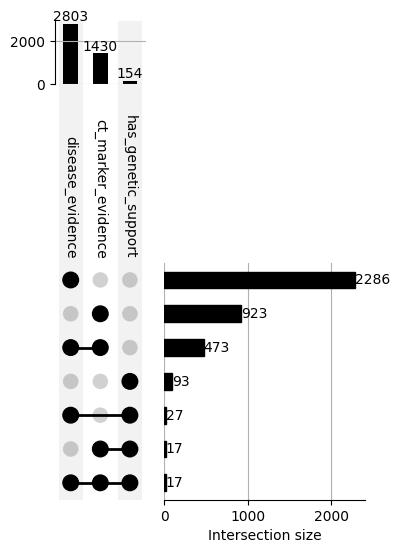

In [121]:
targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']
evidence_cols = ['ct_marker_evidence', 'disease_evidence', 'has_genetic_support']
evidence_sets_dict = {}
for ev in evidence_cols:
    evidence_sets_dict[ev] = targets_res_coarse.target_disease[
        (targets_res_coarse[ev] == 1)
    ].tolist()

evidence_upset = upsetplot.from_contents(evidence_sets_dict)

pl = upsetplot.UpSet(
    evidence_upset, 
    orientation='vertical', 
    show_counts = '{:d}', 
    sort_categories_by='cardinality',
    sort_by='cardinality', 
)
pl.plot()

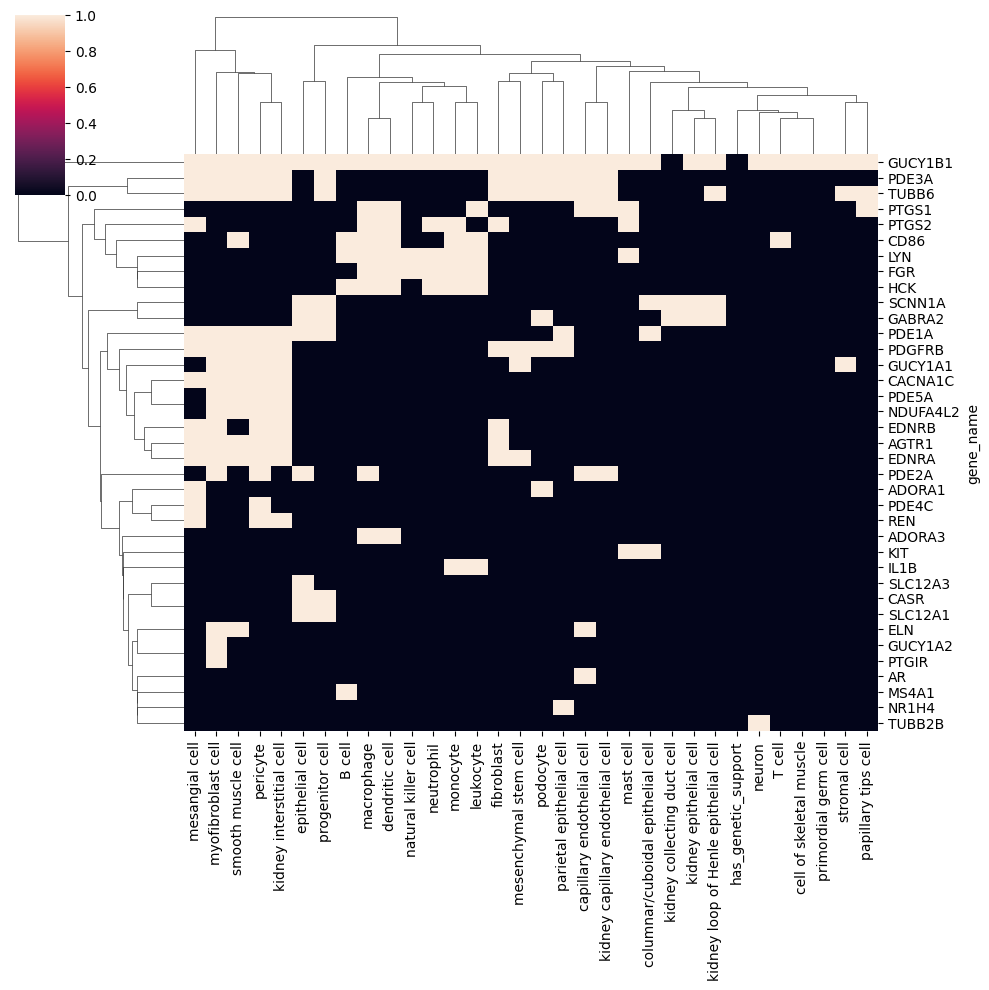

In [114]:
select_gene_ids = targets_res_coarse.gene_id[targets_res_coarse.is_safe == 1]
hm_disease = get_evidence_celltypes(
    DE_res_coarse[DE_res_coarse.gene_id.isin(select_gene_ids)],
    targets_res_coarse, evidence='disease', clinical_status_cols=['has_genetic_support'])

hm_ct = get_evidence_celltypes(
    DE_ct_res_coarse[DE_ct_res_coarse.gene_id.isin(select_gene_ids)], 
    targets_res_coarse, evidence='celltype', clinical_status_cols=['has_genetic_support'])

# sns.clustermap(hm_disease[hm_disease.index.str.startswith("OAS")])
plt.show()
sns.clustermap(hm_ct)

In [26]:
pbulk_adata_coarse = pbulk_adata_coarse.to_memory()

In [27]:
_process_pbulk(pbulk_adata_coarse)

AnnData object with n_obs × n_vars = 879 × 19907
    obs: 'high_level_cell_type_ontology_term_id', 'assay', 'suspension_type', 'disease', 'donor_id', 'size_factors', 'n_cells', 'disease_name_original', 'high_level_cell_type', 'sample_id', 'disease_ontology_id', 'plot_ct_id'
    var: 'soma_joinid', 'feature_id', 'feature_name', 'feature_length', 'mean_logcounts'
    layers: 'logcounts'

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


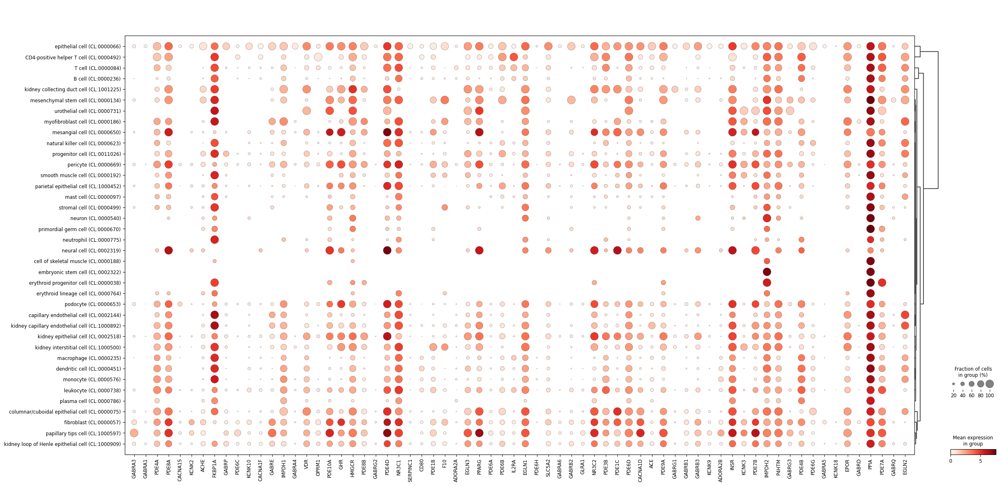

In [49]:
gs = targets_res_coarse.gene_name[(targets_res_coarse.is_approved == 1) & (targets_res_coarse.ct_marker_evidence != 1)].unique()
sc.pl.dotplot(pbulk_adata_coarse, gs, groupby='high_level_cell_type', gene_symbols='feature_name', layer='logcounts', dendrogram=True);

In [125]:
n_pbulks = pbulk_adata_coarse.obs.groupby('high_level_cell_type').count()['assay']
n_cells = pbulk_adata_coarse.obs.groupby('high_level_cell_type').sum('n_cells')['n_cells']
plot_cts = n_pbulks.index[(n_pbulks > 5) & (n_cells > 100)].to_list()
pl_adata = pbulk_adata_coarse[pbulk_adata_coarse.obs['high_level_cell_type'].isin(plot_cts)].copy()


In [135]:
order_cts = ['epithelial cell (CL:0000066)',
 'kidney collecting duct cell (CL:1001225)',
 'columnar/cuboidal epithelial cell (CL:0000075)',
 'parietal epithelial cell (CL:1000452)',
 'kidney loop of Henle epithelial cell (CL:1000909)',
 'kidney epithelial cell (CL:0002518)',
 'kidney interstitial cell (CL:1000500)',
 'papillary tips cell (CL:1000597)',
 'stromal cell (CL:0000499)',
    'mesangial cell (CL:0000650)',
    'smooth muscle cell (CL:0000192)',
 'pericyte (CL:0000669)',
 'podocyte (CL:0000653)',
              'capillary endothelial cell (CL:0002144)',
 'kidney capillary endothelial cell (CL:1000892)',
 'myofibroblast cell (CL:0000186)',
    'fibroblast (CL:0000057)',

 'primordial germ cell (CL:0000670)',
              'progenitor cell (CL:0011026)',
 'mesenchymal stem cell (CL:0000134)',
 'macrophage (CL:0000235)',
    'monocyte (CL:0000576)',
 'mast cell (CL:0000097)',
              'dendritic cell (CL:0000451)',
              'natural killer cell (CL:0000623)',
 'T cell (CL:0000084)',
 'CD4-positive helper T cell (CL:0000492)',
              'B cell (CL:0000236)',
 'leukocyte (CL:0000738)',
 'plasma cell (CL:0000786)',
]

order_cts = pd.Series(order_cts)[pd.Series(order_cts).isin(pl_adata.obs['high_level_cell_type'].unique())].tolist()

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


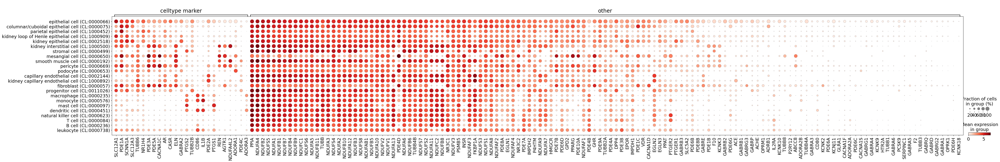

In [136]:
gs_markers = targets_res_coarse.gene_name[(targets_res_coarse.is_effective == 1) & (targets_res_coarse.ct_marker_evidence == 1)].unique()
gs_other = targets_res_coarse.gene_name[(targets_res_coarse.is_effective == 1) & (targets_res_coarse.ct_marker_evidence != 1)].unique()

# reorder by mean expression
gs_markers = pbulk_adata_coarse.var.set_index('feature_name').loc[gs_markers, 'mean_logcounts'].sort_values(ascending=False).index
gs_other = pbulk_adata_coarse.var.set_index('feature_name').loc[gs_other, 'mean_logcounts'].sort_values(ascending=False).index

with plt.rc_context({'font.size':20}):
    sc.pl.dotplot(pl_adata, 
                  {'celltype marker':gs_markers, 'other':gs_other}, 
                  groupby='high_level_cell_type', gene_symbols='feature_name', layer='logcounts', 
                  var_group_rotation=0,
                  categories_order=order_cts);

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


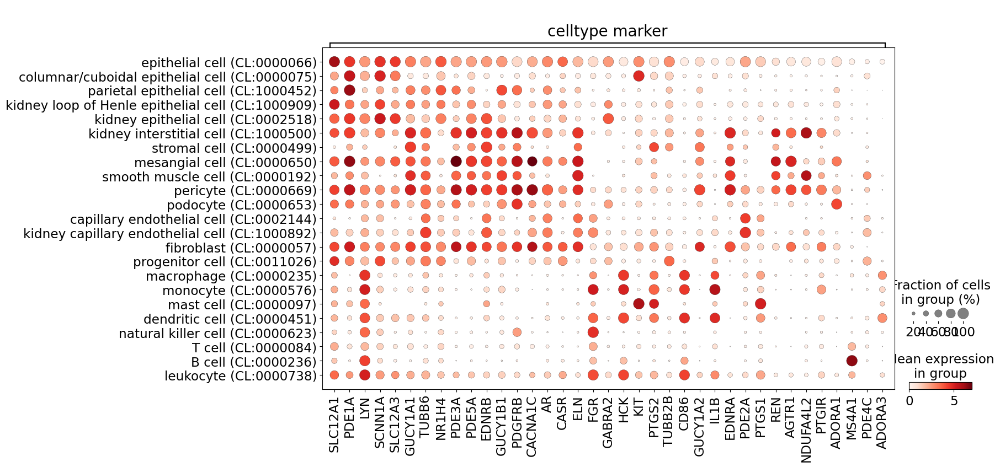

In [137]:
gs_markers = targets_res_coarse.gene_name[(targets_res_coarse.is_safe == 1) & (targets_res_coarse.ct_marker_evidence == 1)].unique()

# reorder by mean expression
gs_markers = pbulk_adata_coarse.var.set_index('feature_name').loc[gs_markers, 'mean_logcounts'].sort_values(ascending=False).index

with plt.rc_context({'font.size':20}):
    sc.pl.dotplot(pl_adata, 
                  {'celltype marker':gs_markers}, 
                  groupby='high_level_cell_type', gene_symbols='feature_name', layer='logcounts', 
                  var_group_rotation=0,
                  categories_order=order_cts);

In [116]:
enr_genetics = enrichment_analysis(
        targets_res_coarse, 
        filter_evidence = dict({(x,1) if x=='has_genetic_support' else (x,0) for x in evidence_cols}), 
        filter_gene_class=GENE_CLASS_ORDER,
        fdr_alpha=1
    )

In [119]:
enr_genetics.sort_values('adj_pval')[0:30]

,gene_set,term,pval,adj_pval,genes
24,GO_Biological_Process_2017,regulation of complement activation (GO:0030449),0.000084,0.025085,CD81;CFHR1;C9;CFHR5
0,MSigDB_Hallmark_2020,Estrogen Response Late,0.001050,0.025191,SLC9A3R1;TH;NRIP1;ETFB;ANXA9
424,GO_Cellular_Component_2017,basolateral plasma membrane (GO:0016323),0.000663,0.050375,CD81;KCNQ1;AQP4;PKD1
1,MSigDB_Hallmark_2020,Mitotic Spindle,0.005550,0.054887,ANLN;ARHGDIA;ALMS1;ACTN4
2,MSigDB_Hallmark_2020,Bile Acid Metabolism,0.006861,0.054887,IDI1;SLC22A18;APOA1
425,GO_Cellular_Component_2017,blood microparticle (GO:0072562),0.001471,0.055889,CFHR1;C9;APOA1;APOL1
25,GO_Biological_Process_2017,positive regulation of transcription from RNA ...,0.000538,0.079958,ASXL1;BCAS3;TFDP2;KAT5;CD81;SP3;NRIP1;TET2;PKD1
426,GO_Cellular_Component_2017,RNA polymerase II transcription factor complex...,0.003549,0.080405,ARNT;ASCL2
427,GO_Cellular_Component_2017,integral component of plasma membrane (GO:0005...,0.004996,0.080405,CD81;C9;LMAN2;LANCL1;SLC6A13;AQP4;SLC28A2;SLC1...
428,GO_Cellular_Component_2017,motile cilium (GO:0031514),0.005290,0.080405,RSPH9;PKD1


In [141]:
all_other_enr = pd.DataFrame()
evidence_cols = ['has_genetic_support', 'disease_evidence', 'ct_marker_evidence']

for ev in evidence_cols:
    other_enr = enrichment_analysis(
        targets_res_coarse, 
        filter_evidence = dict({(x,1) if x==ev else (x,0) for x in evidence_cols}), 
        filter_gene_class=GENE_CLASS_ORDER,
        fdr_alpha=1
    )
    other_enr['evidence'] = ev
    all_other_enr = pd.concat([all_other_enr, other_enr])


other_enr = enrichment_analysis(
        targets_res_coarse, 
        filter_evidence = dict({(x,1) if x != 'has_genetic_evidence' else (x,0)for x in evidence_cols}), 
        filter_gene_class=['other'],
        fdr_alpha=1
    )
other_enr['evidence'] = 'genetics AND disease'
all_other_enr = pd.concat([all_other_enr, other_enr])

/tmp/ipykernel_5884/1060947099.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_enr['evidence'] = ev
/tmp/ipykernel_5884/1060947099.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_enr['evidence'] = ev
/tmp/ipykernel_5884/1060947099.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

In [144]:
all_other_enr['top10_genes'] = [';'.join(x[0:10]) for x in all_other_enr['genes'].str.split(";")]
all_other_enr_signif = all_other_enr[all_other_enr['adj_pval'] < 0.05]

# gen_enr = all_other_enr[all_other_enr.evidence == 'has_genetic_support'].copy()
# np.unique(sum(gen_enr['genes'].str.split(";", expand=False).values, []))

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


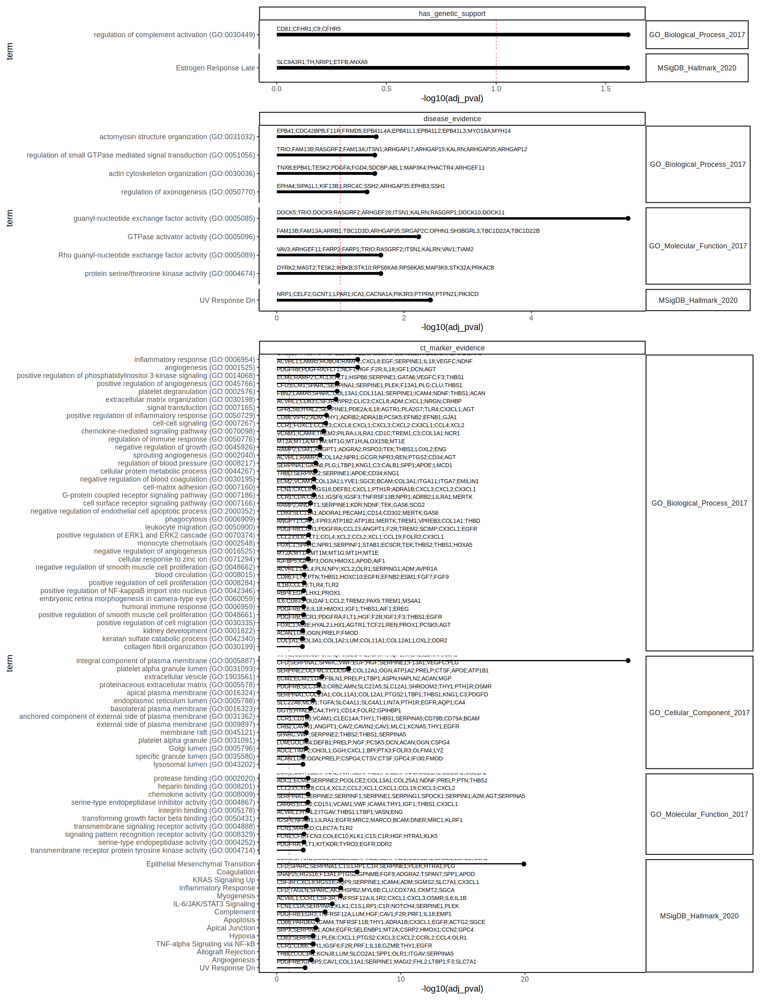

In [161]:
%%R -i all_other_enr_signif -w 1900 -h 2500 
p1 <- all_other_enr_signif %>%
    filter(evidence == 'has_genetic_support') %>%
    arrange( - adj_pval) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 
p2 <- all_other_enr_signif %>%
    filter(evidence == 'disease_evidence') %>%
#     filter(adj_pval < 0.01) %>%
#     slice_min(adj_pval, n=10) %>%
    arrange( - adj_pval) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 
p3 <- all_other_enr_signif %>%
    filter(evidence == 'ct_marker_evidence') %>%
#     slice_min(adj_pval, n=10) %>%
    filter(adj_pval < 0.01) %>%
    arrange( - adj_pval) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 
    
(p1 / p2 / p3) +
plot_layout(heights=c(0.2,0.6,2))

### Fraction plots

In [146]:
n_x_disease = targets_evidence_all.groupby('disease_ontology_id').sum()
# test_diseases = n_x_disease.index[(n_x_disease['has_genetic_support'] > 0) & (n_x_disease['is_approved'] > 0)]

pl_df = targets_evidence_all.groupby(['disease_ontology_id','gene_class']).sum()[['disease_evidence', 'ct_marker_evidence', 'is_approved', 'is_effective', 'is_safe', 'has_genetic_support']]
pl_df = pl_df.reset_index().melt(['disease_ontology_id','gene_class'], var_name='evidence', value_name='n_targets')
# pl_df = pl_df[pl_df.disease_ontology_id.isin(test_diseases)].copy()
pl_df['disease'] = [disease_name_mapper[x] for x in pl_df.disease_ontology_id.str.replace('_',':')]
pl_df['group'] = np.where(pl_df.evidence.isin(evidence_cols), 'support', 'success')

disease_order = targets_evidence_all[['disease', 'disease_relevant_tissue']].drop_duplicates().sort_values('disease_relevant_tissue')['disease']

/tmp/ipykernel_5884/1676163733.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  n_x_disease = targets_evidence_all.groupby('disease_ontology_id').sum()
/tmp/ipykernel_5884/1676163733.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  pl_df = targets_evidence_all.groupby(['disease_ontology_id','gene_class']).sum()[['disease_evidence', 'ct_marker_evidence', 'is_approved', 'is_effective', 'is_safe', 'has_genetic_support']]


In [147]:
%%R -i pl_df -i disease_order -w 1000 -h 3000
df <- pl_df %>%
    mutate(gene_class= factor(gene_class, levels=c('catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
           'nuclear_receptors', 'rhodop_gpcr', 'transporters', 'other'))) %>%
    mutate(disease = factor(disease, levels=as.list(disease_order)))
    
pl2 <- df %>%
    mutate(gene_class= factor(gene_class, levels=c('catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
           'nuclear_receptors', 'rhodop_gpcr', 'transporters', 'other'))) %>%
    ggplot(aes(evidence, n_targets, fill=gene_class)) +
    geom_col(position='fill', width=0.7) +
    coord_flip() +
    scale_fill_manual(values=gene_class_palette, name='Gene class') +
    facet_grid(disease~.) +
    xlab('Fraction of genes') +
    theme_classic(base_size=18) +
    theme(
        strip.text.y = element_blank(), 
        legend.position='top',
        strip.background = element_blank())

pl1 <- df %>%
    group_by(disease, group, evidence) %>%
    summarise(n_targets=sum(n_targets)) %>%
    ggplot(aes(evidence, log10(n_targets+1), fill=group)) +
    geom_col(width=0.7) +
    geom_text(aes(label=n_targets), size=5, hjust=-0.05) +
    coord_flip() +
    scale_fill_manual(values=c(support='black', success='#006633')) +
    guides(fill='none') +
    ylim(0,5) +
    ylab('# genes') +
    scale_y_continuous(breaks=seq(0,4), label=c(0,10,100,1000,10000)) +
    facet_grid(disease~.) +
    theme_classic(base_size=18) +
    remove_y_axis() +
    theme(
        strip.text.y = element_text(angle=0), 
        axis.line.y = element_blank(),
        strip.background = element_rect(color=NA, fill='grey'))
    
(pl2 + plot_spacer() + pl1 ) +
    plot_layout(guides='collect', widths=c(1,-0.1, 0.7)) & (theme(legend.position='top')) 

ggsave_figdir('targets_barplots_all', width=12, height=40)

`summarise()` has grouped output by 'disease', 'group'. You can override using
the `.groups` argument.


/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


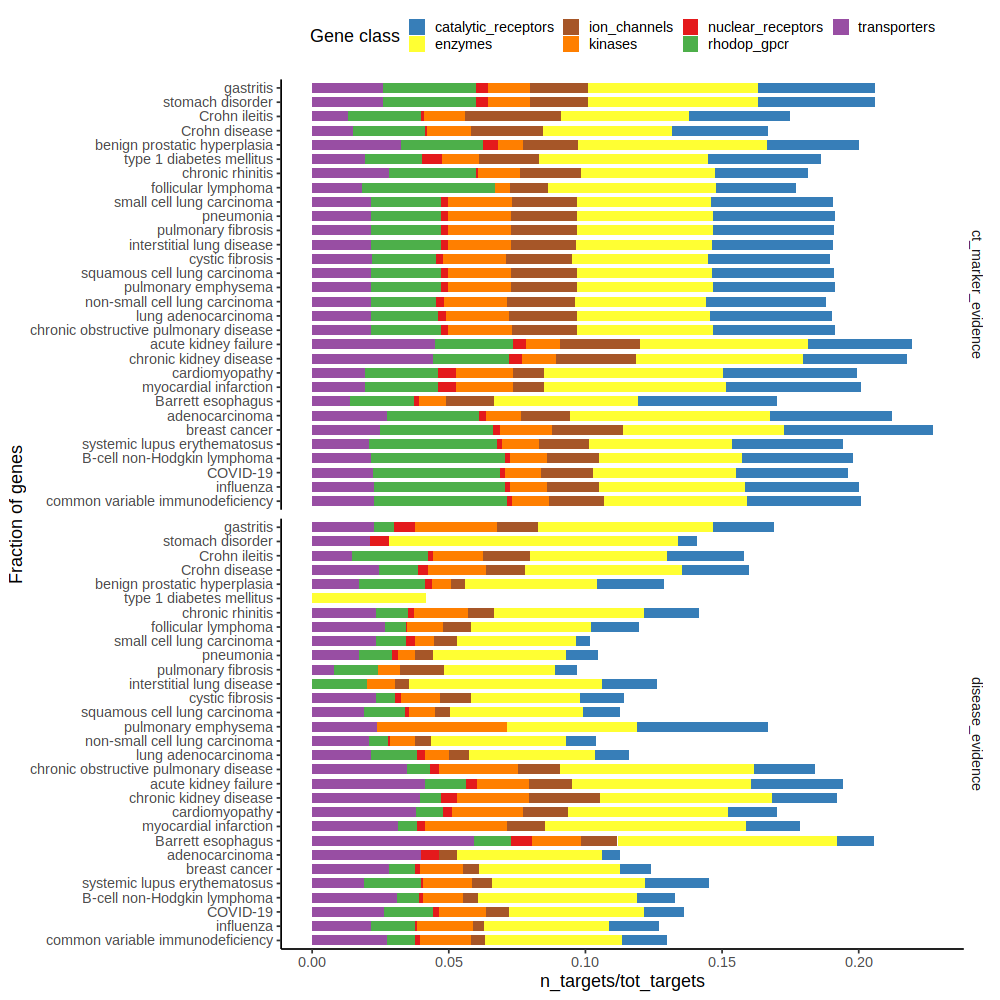

In [160]:
%%R -i pl_df -i disease_order -w 1000 -h 1000
df %>%
    group_by(disease, group, evidence) %>%
    filter(evidence != 'has_genetic_support') %>%
    mutate(tot_targets=sum(n_targets)) %>%
    mutate(gene_class= factor(gene_class, levels=c('catalytic_receptors', 'enzymes', 'ion_channels', 'kinases',
           'nuclear_receptors', 'rhodop_gpcr', 'transporters', 'other'))) %>%
    filter(gene_class!='other' & group == 'support') %>%
    ggplot(aes(disease, n_targets/tot_targets, fill=gene_class)) +
    geom_col(position='stack', width=0.7) +
    coord_flip() +
    scale_fill_manual(values=gene_class_palette, name='Gene class') +
    facet_grid(evidence~.) +
    xlab('Fraction of genes') +
    theme_classic(base_size=18) +
    theme(
        legend.position='top',
        strip.background = element_blank())

/tmp/ipykernel_3108/1429685671.py:26: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  cl_df = pd.concat([df_dis.drop(success_cols, 1), df_ct.drop(success_cols, 1)], axis=1)
/tmp/ipykernel_3108/1429685671.py:26: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  cl_df = pd.concat([df_dis.drop(success_cols, 1), df_ct.drop(success_cols, 1)], axis=1)
/tmp/ipykernel_3108/1429685671.py:54: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  pl_df = pd.concat([pl_df, target_df]).drop('target_class', 1)


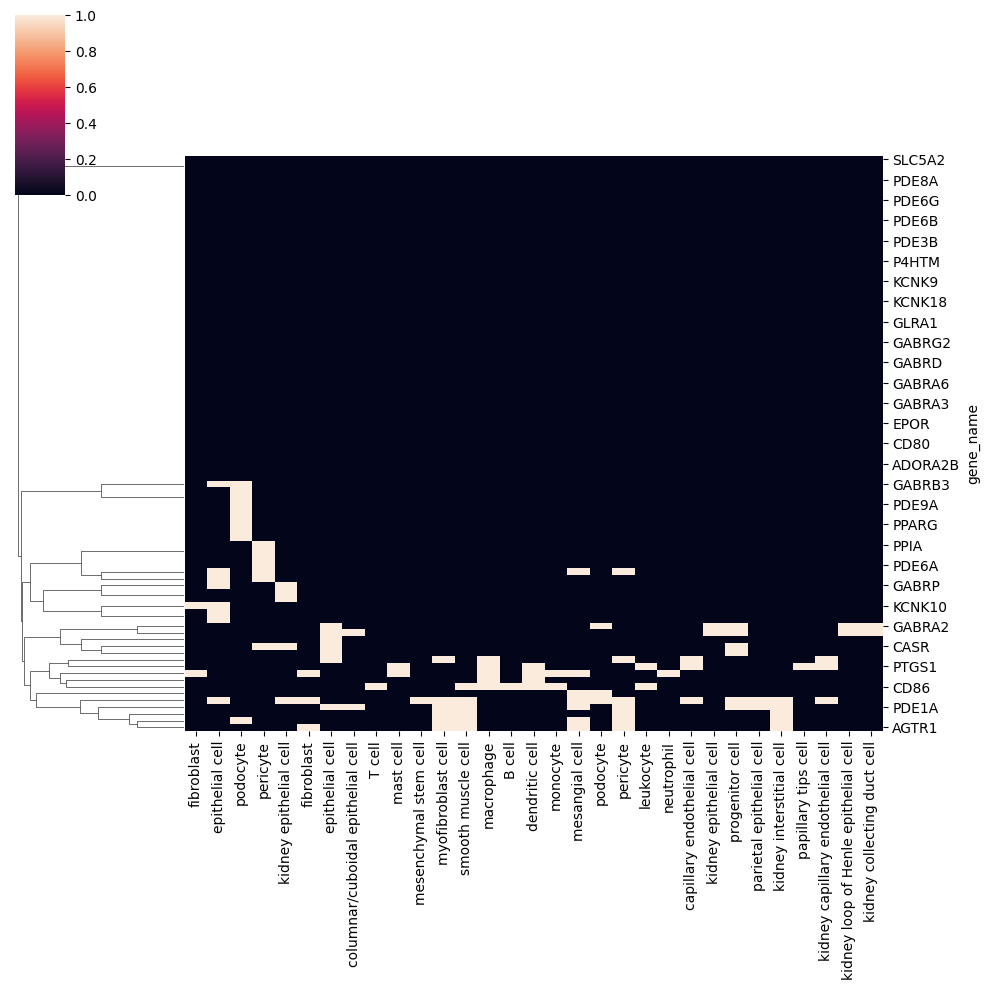

In [79]:
success_cols = ['is_effective', 'is_approved', 'has_genetic_support']
cluster_clinical_status = False

keep_targets = targets_res_coarse[targets_res_coarse['is_approved'] == 1].gene_id
df_ct = get_evidence_celltypes(DE_ct_res_coarse[DE_ct_res_coarse.gene_id.isin(keep_targets)], targets_res_coarse,
                       clinical_status_cols = success_cols, evidence='celltype'
                      )
missing_genes = np.setdiff1d(gene_names_df.gene_name[gene_names_df.gene_id.isin(keep_targets)].values, df_ct.index)
for t in missing_genes:
    df_ct.loc[t] = 0
    t_id = gene_names_df.set_index('gene_name').loc[t][0]
    for col in success_cols:
        df_ct.loc[t, col] = targets_res_coarse.loc[targets_res_coarse.gene_id == t_id, col].values

df_dis = get_evidence_celltypes(DE_res_coarse[DE_res_coarse.gene_id.isin(keep_targets)], targets_res_coarse,
                       clinical_status_cols = success_cols, evidence='disease'
                      )
missing_genes = np.setdiff1d(gene_names_df.gene_name[gene_names_df.gene_id.isin(keep_targets)].values, df_dis.index)
for t in missing_genes:
    df_dis.loc[t] = 0
    t_id = gene_names_df.set_index('gene_name').loc[t][0]
    for col in success_cols:
        df_dis.loc[t, col] = targets_res_coarse.loc[targets_res_coarse.gene_id == t_id, col].values

# Get the row orders
cl_df = pd.concat([df_dis.drop(success_cols, 1), df_ct.drop(success_cols, 1)], axis=1)
cluster = sns.clustermap(cl_df, metric='jaccard', col_cluster=False)
row_order = cl_df.index[cluster.dendrogram_row.reordered_ind]

df_ct = df_ct.reset_index().melt( ['gene_name'] , var_name='celltype')
df_ct['evidence'] = 'celltype_marker'        
df_dis = df_dis.reset_index().melt( ['gene_name'] , var_name='celltype')
df_dis['evidence'] = 'disease'

pl_df = pd.concat([df_dis, df_ct])
pl_df['evidence'] = np.where(pl_df.celltype.isin(success_cols), 'clinical status', pl_df['evidence'])
pl_df['evidence'] = np.where(pl_df.celltype == ('has_genetic_support'), 'genetic support', pl_df['evidence'])

if cluster_clinical_status:
    pl_df['target_success'] = 'is_effective'
    for c in success_cols:
        print(c)
        pl_df['target_success'] = np.where(pl_df.gene_name.isin(pl_df.gene_name[(pl_df.celltype == c) & (pl_df.value == 1)]), c, pl_df['target_success'])
else:
    pl_df['target_success'] = 'targets'

    
pl_df['target_class'] = [reversed_annos[x] if x in reversed_annos.keys() else np.nan for x in pl_df.gene_name]

target_df = pl_df[['gene_name', 'target_class']].drop_duplicates()
target_df.columns = ['gene_name', 'value']
target_df['celltype'] = 'target_class'
target_df['evidence'] = 'target_class'
pl_df = pd.concat([pl_df, target_df]).drop('target_class', 1)

pl_df.loc[pl_df.value == 1, 'value'] = 'yes'
pl_df = pl_df[pl_df.value != 0].copy()

In [80]:
ct_order_coarse = pl_df.celltype[pl_df['evidence'].isin(['celltype_marker', 'disease'])].unique()

In [81]:
%%R -i pl_df -i ct_order_coarse -i row_order -i success_cols 
head(pl_df)

  gene_name        celltype value evidence target_success
1     PTGS2      fibroblast   yes  disease        targets
2    KCNK10      fibroblast   yes  disease        targets
3     GABRP epithelial cell   yes  disease        targets
4    KCNK10 epithelial cell   yes  disease        targets
5     PDE4C epithelial cell   yes  disease        targets
6   ADORA2A epithelial cell   yes  disease        targets


/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


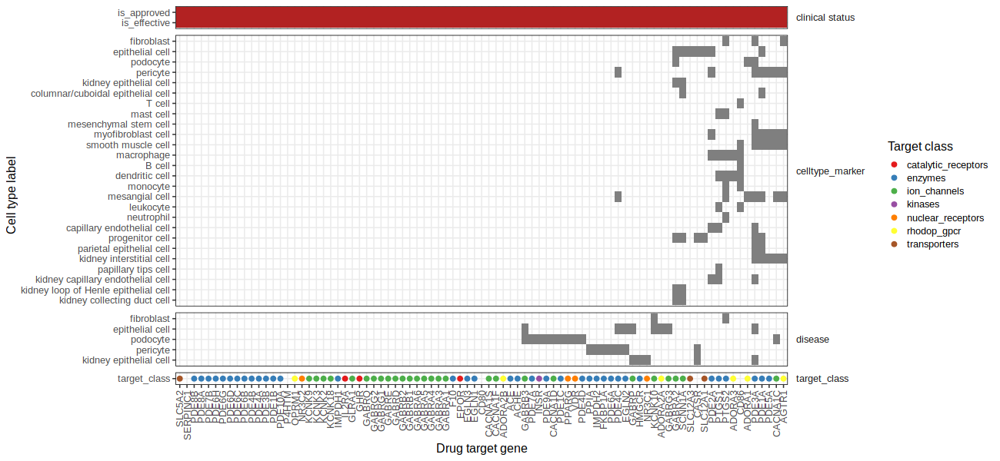

In [83]:
%%R -w 1300 -h 600
pl_df %>%
    filter(celltype != 'malignant cell') %>%
    mutate(evidence = factor(evidence, levels=c('clinical status','celltype_marker', 'disease','genetic support',  'target_class'))) %>%
    mutate(celltype = factor(celltype, levels=c('target_class', rev(ct_order_coarse), success_cols))) %>%
    mutate(gene_name = factor(gene_name, levels=row_order)) %>%
    ggplot(aes(gene_name, celltype)) +
    geom_tile(data = . %>% filter(evidence != 'target_class'),fill='grey50') +
    geom_tile(data = . %>% filter(evidence == 'clinical status'),
              fill='firebrick') +
    geom_point(data = . %>% filter(celltype == 'target_class' & !is.na(value)), 
               aes(color=value), size=3) +
    facet_grid(evidence~., scales='free', space='free') +
    scale_color_brewer(palette='Set1', name='Target class') +
    theme_bw(base_size=16) +
    ylab('Cell type label') + xlab('Drug target gene') +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5), 
          strip.text.y = element_text(angle=0, hjust=0),
          strip.background = element_rect(fill = "transparent", color=NA),
           strip.placement = "outside",
            panel.border = element_rect(color = "black", fill = NA)
         )

### Pulmonary emphysema

In [187]:
disease_ontology_id = 'MONDO_0004849'

In [188]:
pbulk_adata_coarse = sc.read_h5ad(data_dir + f'cellxgene_targets_{disease_ontology_id.replace(":", "_")}.pbulk_all_genes.h5ad', backed=True)
# pbulk_adata_coarse = _process_pbulk(pbulk_adata_coarse)
pbulk_adata_coarse[pbulk_adata_coarse.obs['disease'] != 'normal'].obs.donor_id.nunique()


3

In [189]:
gene_names_df = pbulk_adata_coarse.var[['feature_name', 'feature_id']].copy()
gene_names_df.columns = ['gene_name', 'gene_id']

In [190]:
## Read results with coarse annotations
targets_res_coarse = targets_evidence_all[targets_evidence_all.disease_ontology_id == disease_ontology_id]
DE_res_coarse = pd.read_csv(f'../data/DE_diseasecelltype_{disease_ontology_id}.hvgs.csv')
DE_ct_res_coarse = pd.read_csv(f'../data/DE_celltype_{disease_ontology_id}.hvgs.csv')

In [191]:
targets_res_coarse.sum()

/tmp/ipykernel_5884/3764932892.py:1: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  targets_res_coarse.sum()


Unnamed: 0.1                                                      3102741190
Unnamed: 0                                                        3102741190
gene_id                    ENSG00000041357ENSG00000065989ENSG00000073605E...
disease_ontology_id        MONDO_0004849MONDO_0004849MONDO_0004849MONDO_0...
genetic_association                                                11.145556
known_drug                                                          9.750039
is_druggable                                                            22.0
is_safe                                                                 22.0
is_effective                                                            12.0
is_approved                                                              4.0
has_genetic_support                                                     45.0
ct_marker_evidence                                                    1166.0
bulk_disease_evidence                                                    1.0

In [192]:
success_cols = ['is_safe','is_effective', 'is_approved']
cluster_clinical_status = True
evidence_cols = ['has_genetic_support', 'disease_evidence', 'ct_marker_evidence']

## -- Get info on explored targets -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 1][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
row_order = pl_df.sort_values(['gene_class'] + evidence_cols).gene_name.unique().tolist() # Order by gene class

# Group targets by highest success
pl_df['success_group'] = np.where(
    (pl_df.is_safe == 1) & (pl_df.is_effective == 0), 'safe',
    np.where((pl_df.is_approved == 0) & (pl_df.is_effective == 1), 'effective', 'approved'))

targets_pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class', 'success_group']).copy()
targets_pl_df['col_class'] = np.where(targets_pl_df['variable'].isin(evidence_cols), 'evidence', 'drug target\nclass')

## -- Get fraction of unexplored targets by class -- ##
pl_df = targets_res_coarse[targets_res_coarse['is_safe'] == 0][evidence_cols + success_cols + ['gene_name', 'gene_class']]
pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
pl_df = pd.melt(pl_df, id_vars = ['gene_name', 'gene_class'])
frac_pl_df = pl_df[pl_df.value == 1].groupby(['variable','gene_class']).sum().reset_index()

/tmp/ipykernel_5884/1740083542.py:7: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5884/1740083542.py:20: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  pl_df.loc[:,'gene_class'] = pl_df['gene_class'].astype('category').cat.set_categories(GENE_CLASS_ORDER)
/tmp/ipykernel_5884/1740083542.py:22: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


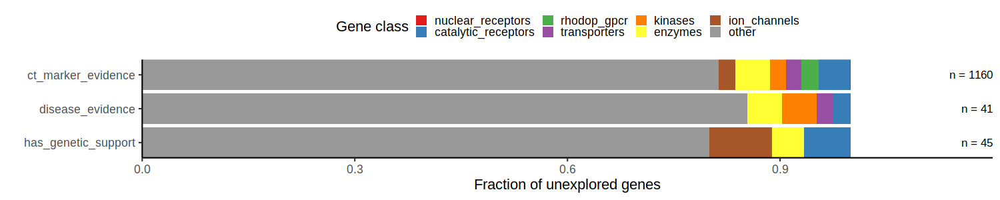

In [193]:
%%R -i targets_pl_df -i frac_pl_df -i evidence_cols -i row_order -w 1500 -h 300
# lapply(c('safe', 'effective', 'approved'), function(success_col){ 
pl1 <- targets_pl_df %>%
    mutate(value= ifelse(value==1, '1', NA)) %>%
    mutate(variable = factor(variable, levels=c(unlist(evidence_cols), 'is_approved', 'is_effective', 'is_safe'))) %>%
    arrange(variable) %>%
    mutate(gene_name=factor(gene_name, levels=row_order)) %>%
    ggplot(aes(gene_name, variable)) +
    geom_tile(aes(fill=value)) +
    geom_point(data=. %>% group_by(gene_name) %>% mutate(variable='target_class', col_class=''), aes(color=gene_class), 
               shape=15, size=5) +
    facet_grid(col_class~success_group, scales='free', space='free') +
    scale_color_manual(values=gene_class_palette, name='Gene class') +
    scale_fill_manual(values=c('black'), na.value="white") +
    theme_classic(base_size=22) +
    ylab('Cell type label') + xlab('Drug target gene') +
    guides(fill='none', color='none') +
    theme(axis.text.x=element_text(angle=90, hjust=1, vjust=0.5), 
          strip.text.y = element_text(angle=0, hjust=0),
          strip.background = element_rect(fill = "transparent", color=NA),
           strip.placement = "outside",
            panel.border = element_rect(color = "black", fill = NA)) 

pl1 + ggsave_figdir('PulmEmph_explored_targets', width=10, height=5)

pl2 <- frac_pl_df %>%
    mutate(variable = factor(variable, levels=c('has_genetic_support', 'disease_evidence', 'ct_marker_evidence'))) %>%
    group_by(variable) %>%
    mutate(n = sum(value)) %>%
    ggplot(aes(variable, value)) +
    geom_col(aes(fill=gene_class), position='fill') +
    geom_text(data = . %>% distinct(n, variable),
              aes(y=1.2, label=paste('n =', n)), size=6, hjust=1) +
    scale_fill_manual(values=gene_class_palette, name='Gene class') +
    theme_classic(base_size=22) +
    ylab('Fraction of unexplored genes') + xlab('') +
    coord_flip(expand=FALSE) +
    theme(legend.position='top')

pl2 + ggsave_figdir('PulmEmph_fraction_unexplored', width=12, height=3)

/tmp/ipykernel_5884/2103994140.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']


{'matrix': <AxesSubplot: >,
 'shading': <AxesSubplot: >,
 'totals': <AxesSubplot: >,
 'intersections': <AxesSubplot: xlabel='Intersection size'>}

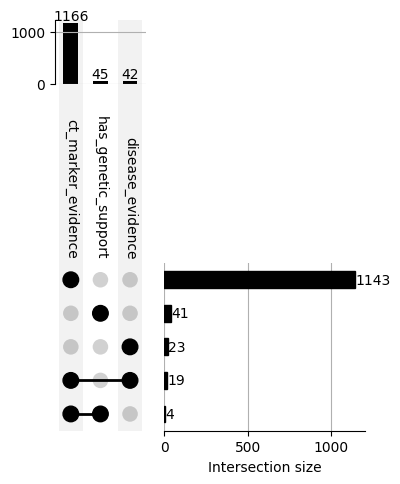

In [194]:
targets_res_coarse['target_disease'] = targets_res_coarse['gene_id'] + "_" + targets_res_coarse['disease_ontology_id']
evidence_cols = ['ct_marker_evidence', 'disease_evidence', 'has_genetic_support']
evidence_sets_dict = {}
for ev in evidence_cols:
    evidence_sets_dict[ev] = targets_res_coarse.target_disease[
        (targets_res_coarse[ev] == 1)
    ].tolist()

evidence_upset = upsetplot.from_contents(evidence_sets_dict)

pl = upsetplot.UpSet(
    evidence_upset, 
    orientation='vertical', 
    show_counts = '{:d}', 
    sort_categories_by='cardinality',
    sort_by='cardinality', 
)
pl.plot()

In [195]:
all_other_enr = pd.DataFrame()
evidence_cols = ['has_genetic_support', 'disease_evidence', 'ct_marker_evidence']

for ev in evidence_cols:
    other_enr = enrichment_analysis(
        targets_res_coarse, 
        filter_evidence = dict({(x,1) if x==ev else (x,0) for x in evidence_cols}), 
        filter_gene_class=GENE_CLASS_ORDER,
        fdr_alpha=1
    )
    other_enr['evidence'] = ev
    all_other_enr = pd.concat([all_other_enr, other_enr])

/tmp/ipykernel_5884/2042915117.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  other_enr['evidence'] = ev


In [196]:
all_other_enr['top10_genes'] = [';'.join(x[0:10]) for x in all_other_enr['genes'].str.split(";")]
all_other_enr_signif = all_other_enr[all_other_enr['adj_pval'] < 0.05]
all_other_enr_signif = all_other_enr_signif[[len(x) > 1 for x in all_other_enr_signif['top10_genes'].str.split(";")]].copy()

In [197]:
# gen_enr = all_other_enr[all_other_enr.evidence == 'ct_marker_evidence'].copy()
# gen_enr.sort_values('term')

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


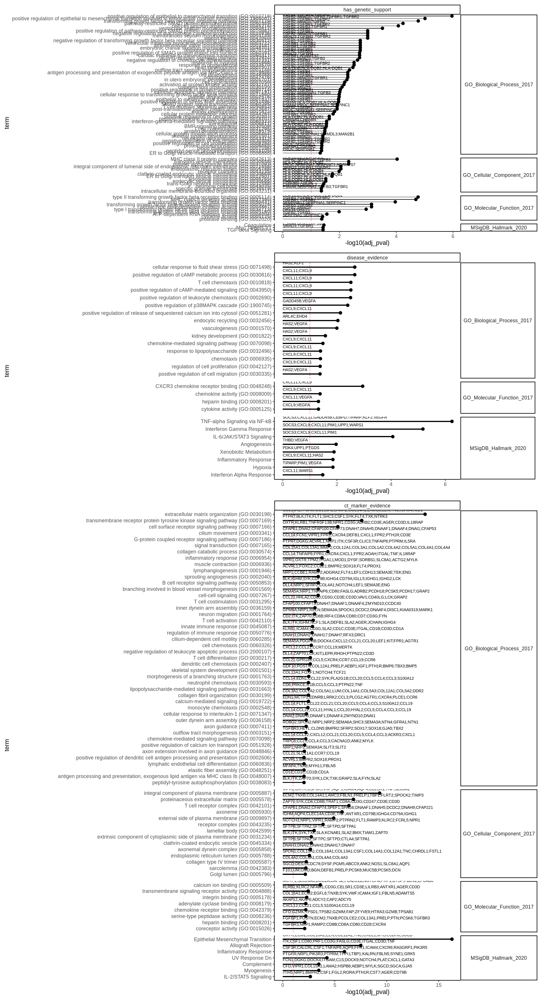

In [199]:
%%R -i all_other_enr_signif -w 1900 -h 3500 
p1 <- all_other_enr_signif %>%
    filter(evidence == 'has_genetic_support') %>%
    arrange( - adj_pval) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 
p2 <- all_other_enr_signif %>%
    filter(evidence == 'disease_evidence') %>%
#     slice_min(adj_pval, n=10) %>%
    arrange( - adj_pval) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 
p3 <- all_other_enr_signif %>%
    filter(evidence == 'ct_marker_evidence') %>%
#     slice_min(adj_pval, n=10) %>%
    arrange( - adj_pval) %>%
    filter(adj_pval < 0.01) %>%
    mutate(term = factor(term, levels=term)) %>%
    ggplot(aes(-log10(adj_pval), term)) +
    geom_vline(xintercept=1, linetype=2, color='red') +
    geom_col(width=0.15, fill='black') +
    geom_point(size=5) +
    geom_text(aes(x=0, label=top10_genes), size=5, vjust=-1, hjust=0) +
#     xlim(0,25) +
    theme_classic(base_size=22) +
    facet_grid(gene_set~evidence, scales='free', space='free') +
    theme(strip.text.y = element_text(angle=0)) 
    
(p1 / p2 / p3) +
plot_layout(heights=c(0.6,0.6,1.3))

---

---

In [21]:
## Read results with coarse annotations
disease_ontology_id = 'MONDO:0005002' # copd
targets_res = pd.read_csv(outdir + f"disease_target_evidence.{disease_ontology_id.replace(':','_')}.csv", index_col=0)
de_res = pd.read_csv(outdir + f"DE_diseasecelltype_{disease_ontology_id.replace(':','_')}.hvgs.csv", index_col=0)
ct_de_res = pd.read_csv(outdir + f"DE_celltype_{disease_ontology_id.replace(':','_')}.hvgs.csv", index_col=0)

In [22]:
adata = sc.read_h5ad(outdir + f'cellxgene_targets_{disease_ontology_id.replace(":","_")}.pbulk_all_genes.h5ad')

In [23]:
adata.var['gene_id'] = adata.var['feature_id'].copy()

In [24]:
targets_res = pd.merge(targets_res, adata.var[['gene_id', 'feature_name']], how='left')

In [25]:
evidence_cols = ['has_genetic_support', 'ct_marker_evidence', 'bulk_disease_evidence', 'disease_evidence', 'disease_ct_evidence']
success_cols = ['is_effective', 'is_approved']

In [30]:
# def plot_evidence(targets_res):
pl_df = targets_res[targets_res['is_approved'] == 1][evidence_cols + success_cols + ['feature_name', 'disease_ontology_id']]
pl_df['disease'] = [disease_name_mapper[x.replace("_", ":")] for x in pl_df['disease_ontology_id']]
pl_df = pd.melt(pl_df, id_vars = ['disease', 'feature_name', 'disease_ontology_id'])
pl_df['col_class'] = np.where(pl_df['variable'].isin(evidence_cols), 'evidence', 'drug target\nclass')

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


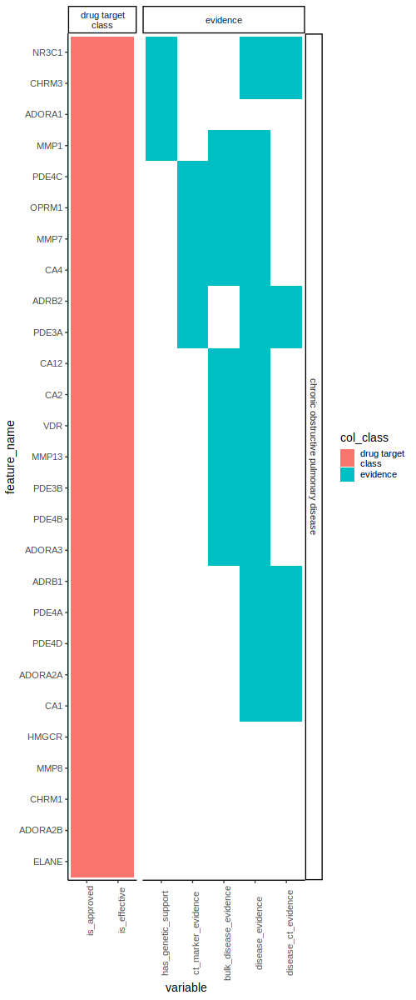

In [32]:
%%R -i pl_df -h 1200 -w 500 -i evidence_cols
pl_df %>%
filter(value == 1) %>%
mutate(variable = factor(variable, levels=c(unlist(evidence_cols), 'is_approved', 'is_effective'))) %>%
arrange(variable) %>%
mutate(feature_name=factor(feature_name, levels=rev(unique(feature_name)))) %>%
ggplot(aes(variable, feature_name, fill=col_class)) +
geom_tile() +
theme_classic(base_size=14) +
facet_grid(disease~col_class, space='free', scales='free') +
theme(axis.text.x=element_text(angle=90))

In [115]:
pbulk_adata = adata

In [116]:
import scipy

In [118]:
## Preprocess expression
cpms = scipy.sparse.csr_matrix(pbulk_adata.X.T / pbulk_adata.obs['size_factors'].values.flatten()) * 1000000
pbulk_adata.layers['logcounts'] = np.log1p(cpms).T
pbulk_adata.var['mean_logcounts'] = np.array(pbulk_adata.layers['logcounts'].mean(0)).flatten()

genes = pl_df.feature_name.unique()
pbulk_adata.obs['plot_ct_id'] = pbulk_adata.obs['high_level_cell_type_ontology_term_id'].str.replace(":", '_')
# missing_cts = [x for x in pbulk_adata.obs['plot_ct_id'].unique() if x not in dotplot_dict.keys()]
pbulk_adata.obs['plot_ct_id'] = pbulk_adata.obs['plot_ct_id'].astype('category')
ct_levels = [f'{ontology2name(x)} ({x})' for x in pbulk_adata.obs['plot_ct_id'].cat.categories.str.replace("_", ":").tolist()]
pbulk_adata.obs['high_level_cell_type'] = [f'{ontology2name(x)} ({x})' for x in pbulk_adata.obs['plot_ct_id'].str.replace("_", ":").tolist()]
pbulk_adata.obs['high_level_cell_type'] = pbulk_adata.obs['high_level_cell_type'].astype('category').cat.reorder_categories(ct_levels)

# with plt.rc_context({'figure.figsize':[14,5]}):
#     fig,axs = plt.subplots(1,1)
#     sc.pl.dotplot(
#         pbulk_adata[(pbulk_adata.obs['disease'] == 'normal')], 
#         genes, 
#         groupby='high_level_cell_type', 
#         gene_symbols='feature_name',
#         layer='logcounts', var_group_rotation=0,
#         swap_axes=False,
#         show=False, ax=axs
#     );
#     fig.tight_layout()
#     plt.show()

In [119]:
def get_expression(pbulk_adata, genes, long=True):
    X = pbulk_adata[:, pbulk_adata.var['feature_name'].isin(genes)].layers['logcounts'].toarray().copy()
    X_df = pd.DataFrame(X, columns=genes, index=pbulk_adata.obs_names)
    X_df['cell_type'] = pbulk_adata.obs['high_level_cell_type'].copy()
    X_df['disease'] = pbulk_adata.obs['disease'].copy()
    # X_df['donor_id'] = pbulk_adata.obs['donor_id'].copy()
    X_df = X_df.reset_index()
    if long:
        return(X_df.melt(id_vars=['cell_type', 'disease', 'index'], var_name='feature_name'))
    else:
        return(X_df)


/tmp/ipykernel_8212/3113666930.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sns.clustermap(X_df.groupby('cell_type').mean(),


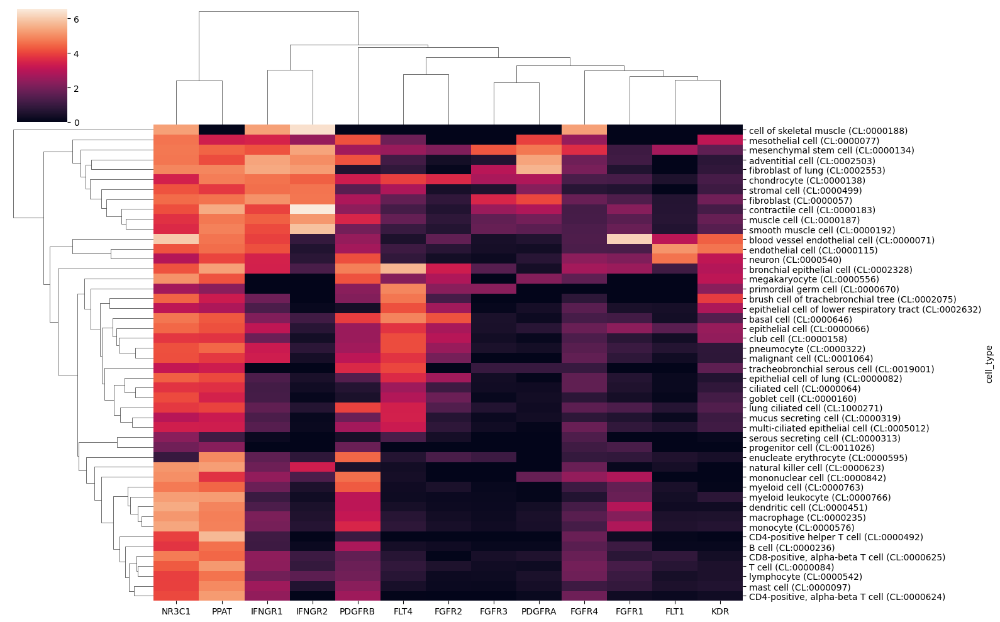

In [120]:
X_df = get_expression(pbulk_adata, genes, long=False)
X_df = X_df[X_df['disease'] == 'normal'].copy()
sns.clustermap(X_df.groupby('cell_type').mean(), 
#                standard_scale=True,
               yticklabels=True,xticklabels=True, figsize=(16,10)
              );
plt.show()

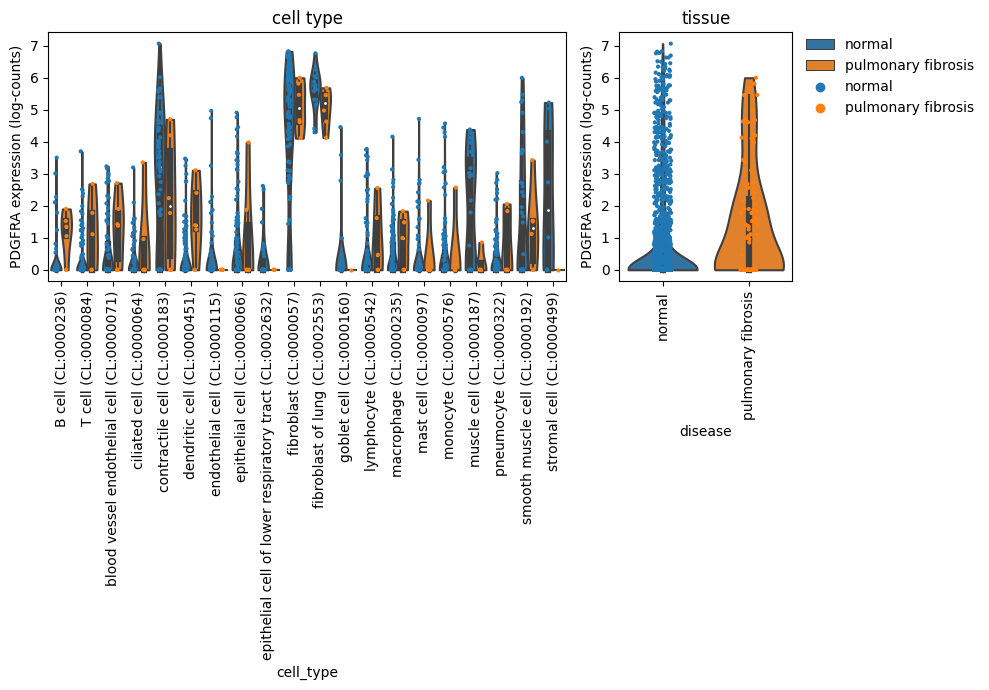

In [121]:
g = "PDGFRA"
pl_disease_df = get_expression(pbulk_adata, [g], long=True)
count_dis = pl_disease_df.groupby('cell_type')['disease'].nunique()
keep_cts = count_dis.index[count_dis > 1].values
pl_disease_df = pl_disease_df[pl_disease_df['cell_type'].isin(keep_cts)]
pl_disease_df['cell_type'] = pl_disease_df['cell_type'].astype('str').astype('category')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 7),gridspec_kw={'width_ratios': [3, 1]})  # You can adjust the figure size as needed
# gs = fig.add_gridspec(1, 2)

# First subplot: Plot by cell type
sns.violinplot(data=pl_disease_df[pl_disease_df['cell_type'].isin(keep_cts)], x='cell_type', y='value',
               cut=False, scale='width', hue='disease', ax=ax1)
sns.stripplot(data=pl_disease_df[pl_disease_df['cell_type'].isin(keep_cts)], x='cell_type', y='value',
              hue='disease', dodge=True, s=3, ax=ax1)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90)
ax1.set_ylabel(f'{g} expression (log-counts)')
ax1.legend().remove()
ax1.set_title('cell type')

# Second subplot: Plot bulk

sns.violinplot(data=pl_disease_df[pl_disease_df['cell_type'].isin(keep_cts)], x='disease', y='value',
               cut=False, scale='width', dodge=False, hue='disease', ax=ax2)
sns.stripplot(data=pl_disease_df[pl_disease_df['cell_type'].isin(keep_cts)], x='disease', y='value', hue='disease',
              dodge=False, s=3, ax=ax2)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90)
ax2.set_ylabel(f'{g} expression (log-counts)')
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, frameon=False)
ax2.set_title('tissue')

# # Adjust the width of the subplots as needed
# ax1.set_position([0.1, 0.1, 0.3, 0.1])  # [left, bottom, width, height]
# ax2.set_position([0.1, 0.1, 0.2, 1])

plt.subplots_adjust(hspace=0.3)
plt.tight_layout()  # Adjust subplot spacing

plt.show()

In [122]:
%%R -i X_df -h 1000 -w 500 
X_df %>%
filter(disease == 'normal') %>%
group_by(feature_name) %>%
mutate(value=scale(value)) %>%
ungroup() %>%
group_by(cell_type, disease, feature_name) %>%
summarise(value=mean(value)) %>%
ggplot(aes(feature_name, cell_type, fill=value)) +
geom_tile() +
scale_fill_gradient2(midpoint=0) 
# facet_grid(cell_type~., scales='free', space='free') +
# theme(axis.text.y=element_blank()) 


/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


Error in `group_by()`:
! Must group by variables found in `.data`.
✖ Column `feature_name` is not found.
Run `rlang::last_trace()` to see where the error occurred.

Error in group_by(., feature_name) : 
✖ Column `feature_name` is not found.


RInterpreterError: Failed to parse and evaluate line "X_df %>%\nfilter(disease == 'normal') %>%\ngroup_by(feature_name) %>%\nmutate(value=scale(value)) %>%\nungroup() %>%\ngroup_by(cell_type, disease, feature_name) %>%\nsummarise(value=mean(value)) %>%\nggplot(aes(feature_name, cell_type, fill=value)) +\ngeom_tile() +\nscale_fill_gradient2(midpoint=0) \n# facet_grid(cell_type~., scales='free', space='free') +\n# theme(axis.text.y=element_blank()) \n".
R error message: 'Error in group_by(., feature_name) : \n✖ Column `feature_name` is not found.'

## Which fraction of targets are amongst HVGs? 

In [33]:
all_targets = pd.read_csv('../data/disease_target_evidence.all.csv', index_col=0)

In [34]:
# for d in all_disease_ids:
#     try
targets_in_hvgs = pd.DataFrame()
for disease_ontology_id in all_targets.disease_ontology_id.unique():
    ct_de_res = pd.read_csv(outdir + f"DE_celltype_{disease_ontology_id.replace(':','_')}.hvgs.csv", index_col=0)
    targets = all_targets[all_targets.disease_ontology_id == disease_ontology_id.replace(':','_')].copy()
    targets = targets[targets.is_effective == 1].copy()
    hvgs = ct_de_res.gene_id.values

    n_in_hvgs = targets['gene_id'].isin(hvgs).sum()
    n_targets = targets.shape[0]
    targets['in_hvgs'] = targets.gene_id.isin(hvgs).astype(int)
    targets['disease_ontology_id'] = disease_ontology_id
    targets_in_hvgs = pd.concat([targets_in_hvgs, targets[['is_safe', 'is_effective', 'is_approved', 'in_hvgs', 'disease_ontology_id']]])

In [35]:
frac = targets_in_hvgs.groupby('disease_ontology_id').sum().reset_index()
frac['frac_safe_in_hvgs'] = frac['in_hvgs']/frac['is_effective'] 
frac = pd.merge(frac, all_targets[['disease_ontology_id', 'disease', 'disease_relevant_tissue']].drop_duplicates(), how='left')

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


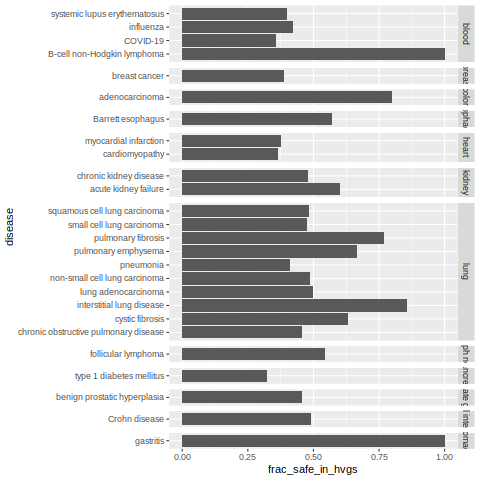

In [36]:
%%R -i frac
frac %>%
ggplot(aes(disease, frac_safe_in_hvgs)) +
geom_col() +
coord_flip() +
facet_grid(disease_relevant_tissue~., scales='free', space='free')

In [37]:
# for d in all_disease_ids:
#     try
targets_in_hvgs = pd.DataFrame()
for disease_ontology_id in all_targets.disease_ontology_id.unique():
    ct_de_res = pd.read_csv(outdir + f"DE_diseasecelltype_{disease_ontology_id.replace(':','_')}.hvgs.csv", index_col=0)
    targets = all_targets[all_targets.disease_ontology_id == disease_ontology_id.replace(':','_')].copy()
    targets = targets[targets.is_effective == 1].copy()
    hvgs = ct_de_res.gene_id.values

    n_in_hvgs = targets['gene_id'].isin(hvgs).sum()
    n_targets = targets.shape[0]
    targets['in_hvgs'] = targets.gene_id.isin(hvgs).astype(int)
    targets['disease_ontology_id'] = disease_ontology_id
    targets_in_hvgs = pd.concat([targets_in_hvgs, targets[['is_safe', 'is_effective', 'is_approved', 'in_hvgs', 'disease_ontology_id']]])

In [38]:
frac = targets_in_hvgs.groupby('disease_ontology_id').sum().reset_index()
frac['frac_safe_in_hvgs'] = frac['in_hvgs']/frac['is_effective'] 
frac = pd.merge(frac, all_targets[['disease_ontology_id', 'disease', 'disease_relevant_tissue']].drop_duplicates(), how='left')

/home/jovyan/my-conda-envs/patho-signatures-2/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


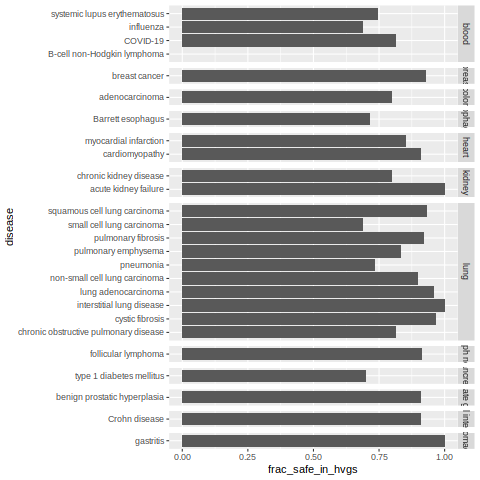

In [39]:
%%R -i frac
frac %>%
ggplot(aes(disease, frac_safe_in_hvgs)) +
geom_col() +
coord_flip() +
facet_grid(disease_relevant_tissue~., scales='free', space='free')